**# TP_Synthese_ImagMEDI**

---



---



> Dans ce nootbook on va exploiter les techniques appris dans les ateliers précédants pour faire le préprocessing des images de Diabetic Retinopathy et celles de BraTS .

---



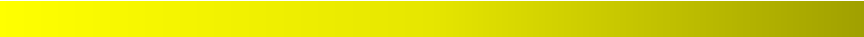

### **Diabetic Retinopathy**

---






#### 1-*Exploration des Données*

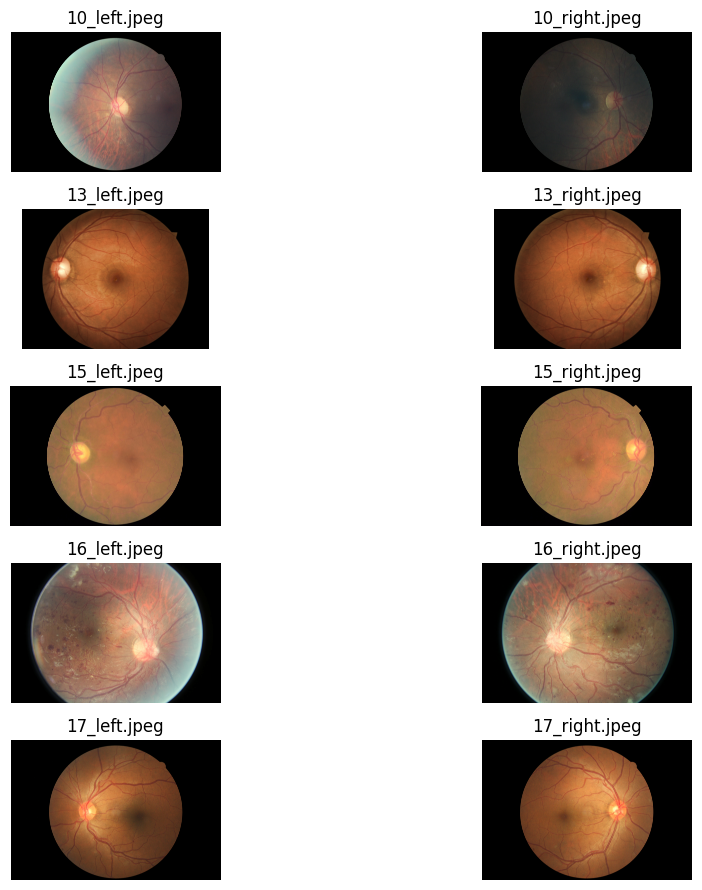

In [91]:
import os
from PIL import Image
import matplotlib.pyplot as plt

dataset_path = "Diabetic_Retinopathy_Data"

# Liste des noms de fichiers des images
image_files = sorted([f for f in os.listdir(dataset_path) if os.path.isfile(os.path.join(dataset_path, f))])
fig, axes = plt.subplots(5, 2, figsize=(12, 9))

# Afficher les images
for i, ax in enumerate(axes.flat):
    if i < len(image_files):
        image_path = os.path.join(dataset_path, image_files[i])
        image = Image.open(image_path)
        ax.imshow(image)
        ax.axis('off')
        ax.set_title(image_files[i])
plt.tight_layout()

# Afficher la figure
plt.show()


---  
> Tous d'abord on jet un coup d'oeil sur l'ensemble des images pour avoir une idée sur les effet qui peuvent être apporté sur notre traitement
---



###### 1-1 Histogramme

---



---



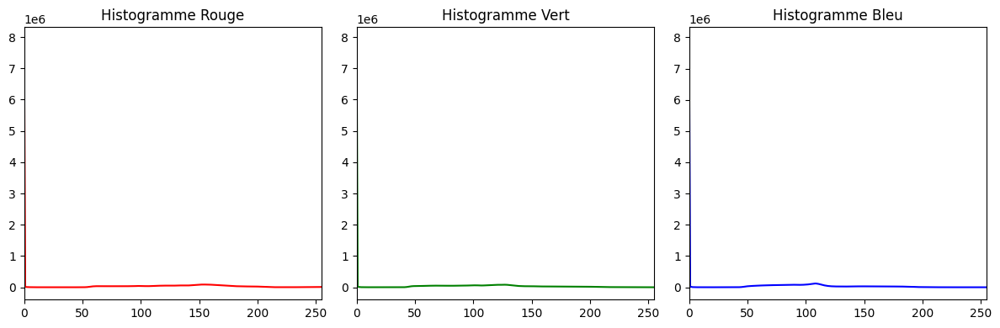

In [92]:
# Sélectionner une image pour l'analyse d'histogramme
image_path = os.path.join(dataset_path, image_files[0])
image = Image.open(image_path)

# Calculer l'histogramme
histogram = image.histogram()

# Diviser l'histogramme en canaux R, G et B
red_channel = histogram[0:256]
green_channel = histogram[256:512]
blue_channel = histogram[512:768]

# Afficher les histogrammes
plt.figure(figsize=(12, 4))

plt.subplot(131)
plt.title('Histogramme Rouge')
plt.plot(red_channel, color='red')
plt.xlim([0, 255])

plt.subplot(132)
plt.title('Histogramme Vert')
plt.plot(green_channel, color='green')
plt.xlim([0, 255])

plt.subplot(133)
plt.title('Histogramme Bleu')
plt.plot(blue_channel, color='blue')
plt.xlim([0, 255])

plt.tight_layout()
plt.show()


---  
> On remarque que les histogrammes présente une ligne constante dans les 3 channels , ce qui signifie que les valeurs sont uniformes due to l'eclairage qui est sombre , ou bien le faite que les images peuvent être en niveau de gris , mais nos images sont en format JPEG ce qui signifie RGB.
---



#### 2-*Amélioration du Contraste*

###### 2-1 L'égalisation


---



---



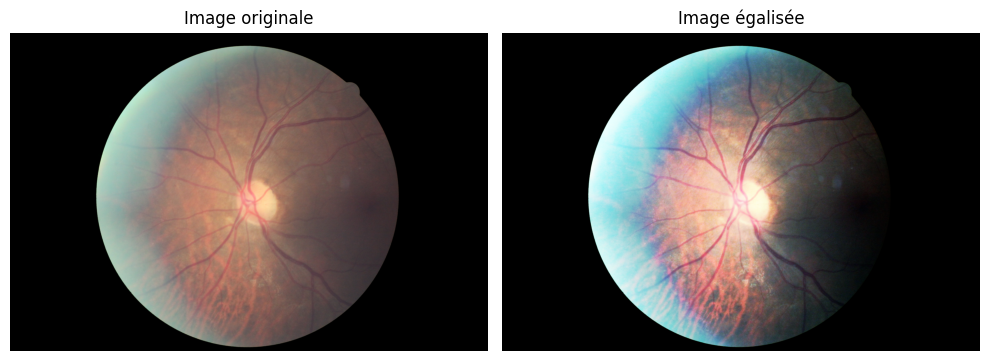

In [93]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

image = cv2.imread(image_path)

# Séparer les canaux de couleur
blue, green, red = cv2.split(image)

# Appliquer l'égalisation de l'histogramme à chaque canal
blue_equalized = cv2.equalizeHist(blue)
green_equalized = cv2.equalizeHist(green)
red_equalized = cv2.equalizeHist(red)

# Fusionner les canaux égalisés
equalized_image = cv2.merge((blue_equalized, green_equalized, red_equalized))

# Afficher l'image originale et l'image égalisée
plt.figure(figsize=(10, 5))

plt.subplot(121)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Image originale')
plt.axis('off')

plt.subplot(122)
plt.imshow(cv2.cvtColor(equalized_image, cv2.COLOR_BGR2RGB))
plt.title('Image égalisée')
plt.axis('off')

plt.tight_layout()
plt.show()




*   Histogramme d'image égalisé:



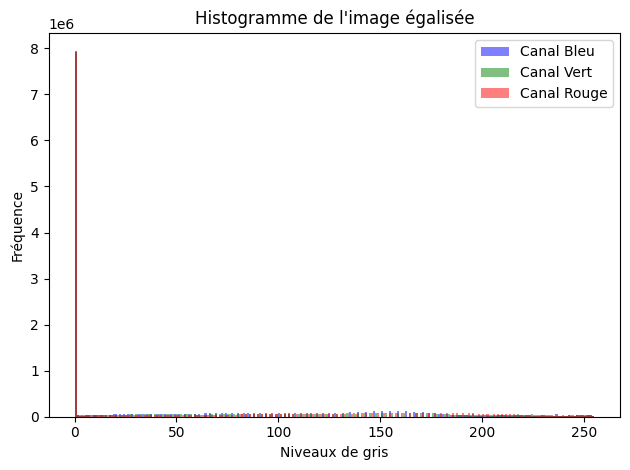

In [94]:
plt.hist(blue_equalized.flatten(), bins=256, color='blue', alpha=0.5, label='Canal Bleu')
plt.hist(green_equalized.flatten(), bins=256, color='green', alpha=0.5, label='Canal Vert')
plt.hist(red_equalized.flatten(), bins=256, color='red', alpha=0.5, label='Canal Rouge')
plt.xlabel('Niveaux de gris')
plt.ylabel('Fréquence')
plt.title('Histogramme de l\'image égalisée')
plt.legend()

plt.tight_layout()
plt.show()


---  
> On remarque que l'égalisation nous a donnée une image qui est bien eclairé au milieu , alors que l'extremité gauche présente un peu d'eclairage et la partie droite est sombre ce qui va engendré une difficulté dans la tache de ségmentation.
---



###### 2-2 La normalisation d’histogramme

---

---






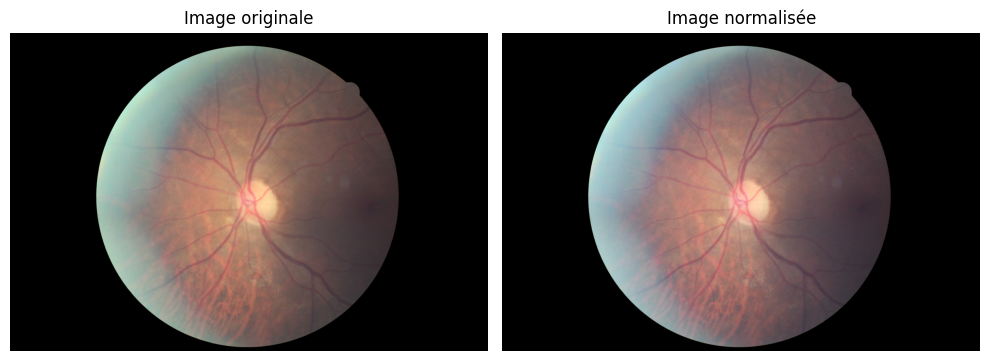

In [95]:
# Convertir en float pour éviter la saturation des valeurs
image_float = image.astype(np.float32)

# Normaliser chaque canal
for i in range(3):
    min_val = np.min(image_float[:,:,i])
    max_val = np.max(image_float[:,:,i])
    image_float[:,:,i] = (image_float[:,:,i] - min_val) / (max_val - min_val) * 255

# Convertir en type d'image entier non signé 8 bits (0-255)
normalized_image = np.uint8(image_float)

# Afficher l'image originale et l'image normalisée
plt.figure(figsize=(10, 5))

plt.subplot(121)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Image originale')
plt.axis('off')

plt.subplot(122)
plt.imshow(cv2.cvtColor(normalized_image, cv2.COLOR_BGR2RGB))
plt.title('Image normalisée')
plt.axis('off')

plt.tight_layout()
plt.show()




*   Histogramme de l'image normalisé:



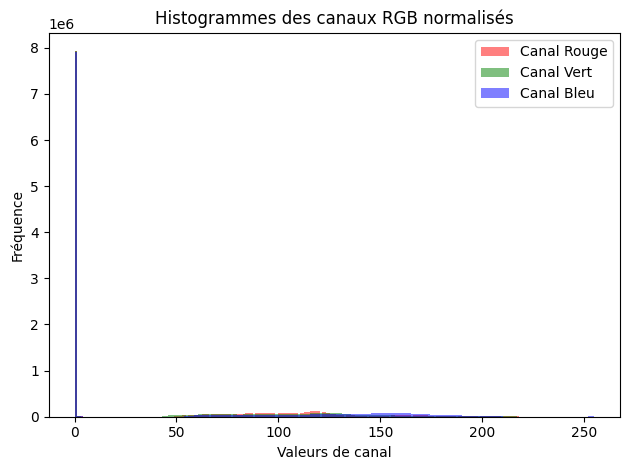

In [96]:
plt.hist(normalized_image[:,:,0].flatten(), bins=256, color='red', alpha=0.5, label='Canal Rouge')
plt.hist(normalized_image[:,:,1].flatten(), bins=256, color='green', alpha=0.5, label='Canal Vert')
plt.hist(normalized_image[:,:,2].flatten(), bins=256, color='blue', alpha=0.5, label='Canal Bleu')
plt.xlabel('Valeurs de canal')
plt.ylabel('Fréquence')
plt.title('Histogrammes des canaux RGB normalisés')
plt.legend()

plt.tight_layout()
plt.show()


---  
> On remarque que la normalisation nous a donnée une image qui est presque la même que l'originale , du coup on va travailler avec le résultat donner par l'égalisation d'histogramme.

---



###### 2-3 l'égalisation adaptative

---

---

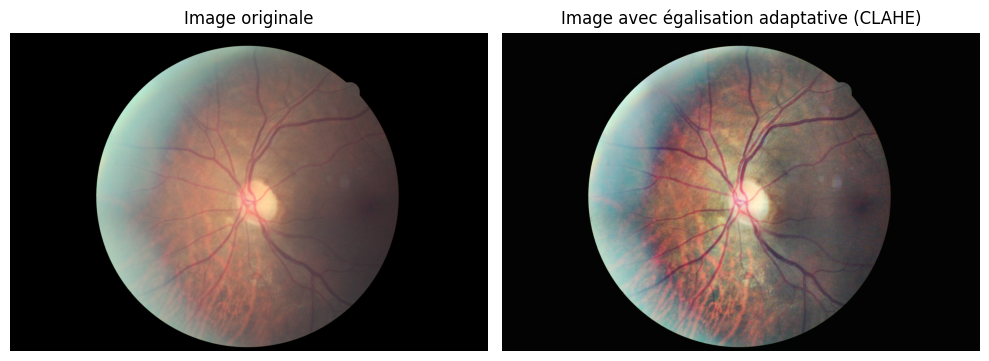

In [97]:
blue, green, red = cv2.split(image)

# Créer un objet CLAHE pour chaque canal
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))

# Appliquer CLAHE à chaque canal
blue_clahe = clahe.apply(blue)
green_clahe = clahe.apply(green)
red_clahe = clahe.apply(red)

# Fusionner les canaux CLAHE
clahe_image = cv2.merge((blue_clahe, green_clahe, red_clahe))

# Afficher l'image originale et l'image avec CLAHE
plt.figure(figsize=(10, 5))

plt.subplot(121)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Image originale')
plt.axis('off')

plt.subplot(122)
plt.imshow(cv2.cvtColor(clahe_image, cv2.COLOR_BGR2RGB))
plt.title('Image avec égalisation adaptative (CLAHE)')
plt.axis('off')

plt.tight_layout()
plt.show()



*   Histogramme de l'image adaptative:


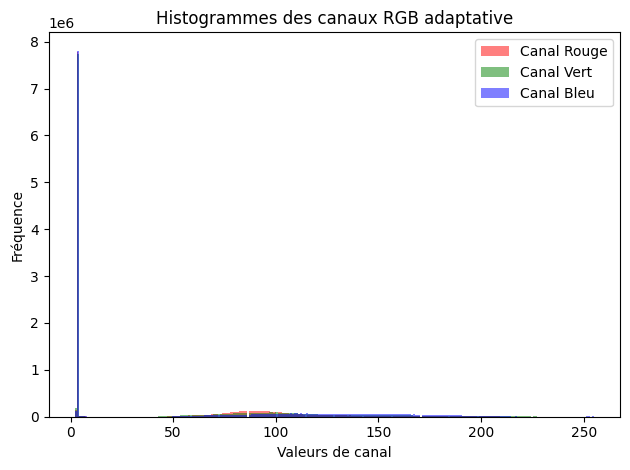

In [98]:
plt.hist(clahe_image[:,:,0].flatten(), bins=256, color='red', alpha=0.5, label='Canal Rouge')
plt.hist(clahe_image[:,:,1].flatten(), bins=256, color='green', alpha=0.5, label='Canal Vert')
plt.hist(clahe_image[:,:,2].flatten(), bins=256, color='blue', alpha=0.5, label='Canal Bleu')
plt.xlabel('Valeurs de canal')
plt.ylabel('Fréquence')
plt.title('Histogrammes des canaux RGB adaptative')
plt.legend()

plt.tight_layout()
plt.show()


---  
> On remarque que l'égalisation adaptative nous a donnée une image qui mieux que celle de la normalisation , elle présente des régions sombres mieu que l'image égalisé , ce qui la rend la bonne choix pour notre cas pour détécter les régions impacté !!!

---



#### 3-*Réduction du Bruit*

###### 3-1 Filtrage Lineaire (Filtre Moyenneur)

---



---







*   Image adaptative




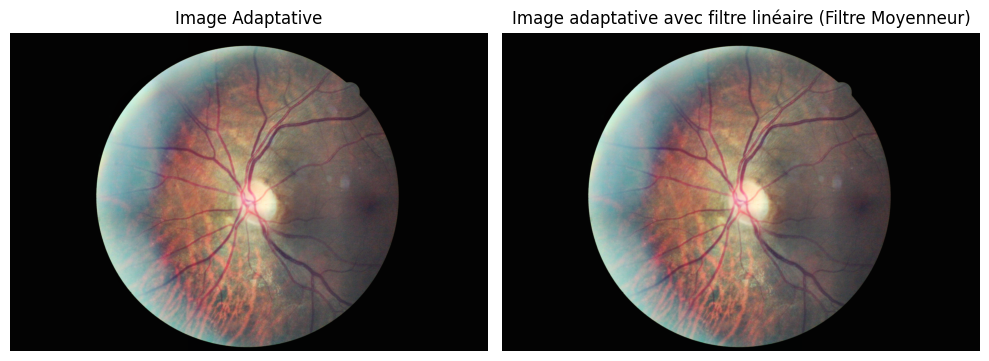

In [99]:
# Appliquer un filtre moyenneur (noyau 3x3)
blurred_image = cv2.blur(clahe_image, (3, 3))

# Afficher l'image adaptative et l'image avec filtre linéaire
plt.figure(figsize=(10, 5))

plt.subplot(121)
plt.imshow(cv2.cvtColor(clahe_image, cv2.COLOR_BGR2RGB))
plt.title('Image Adaptative')
plt.axis('off')

plt.subplot(122)
plt.imshow(cv2.cvtColor(blurred_image, cv2.COLOR_BGR2RGB))
plt.title('Image adaptative avec filtre linéaire (Filtre Moyenneur)')
plt.axis('off')

plt.tight_layout()
plt.show()


---  
> On remarque que le filtrage moyanneur n'a pas affecte l'image adaptative

---



*  Image égalisé

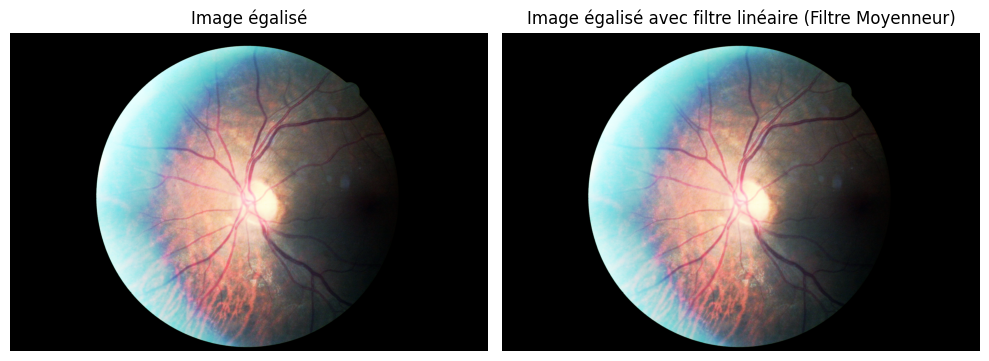

In [100]:
# Appliquer un filtre moyenneur (noyau 3x3)
blurred_image = cv2.blur(equalized_image, (3, 3))

plt.figure(figsize=(10, 5))

plt.subplot(121)
plt.imshow(cv2.cvtColor(equalized_image, cv2.COLOR_BGR2RGB))
plt.title('Image égalisé')
plt.axis('off')

plt.subplot(122)
plt.imshow(cv2.cvtColor(blurred_image, cv2.COLOR_BGR2RGB))
plt.title('Image égalisé avec filtre linéaire (Filtre Moyenneur)')
plt.axis('off')

plt.tight_layout()
plt.show()


---  
> La même chose pour l'image égalisé.

---



###### 3-2 Filtrage Non Lineaire (Filtre Médian)

---



---





*  Image adaptative

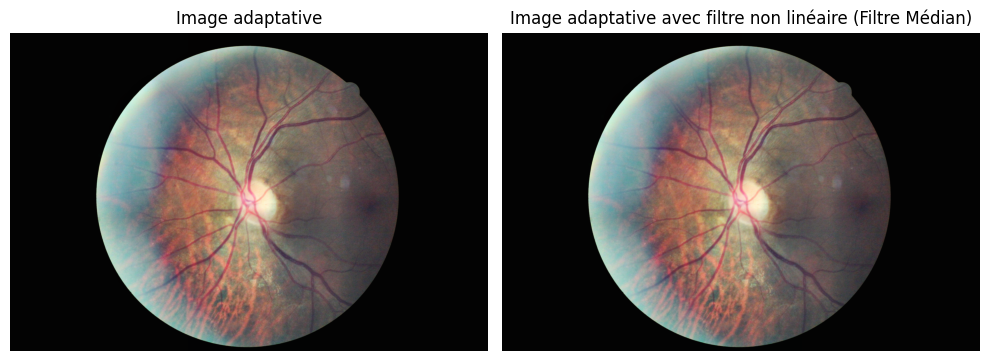

In [101]:
# Appliquer un filtre médian (noyau 3x3)
median_filtered_image = cv2.medianBlur(clahe_image, 3)


plt.figure(figsize=(10, 5))

plt.subplot(121)
plt.imshow(cv2.cvtColor(clahe_image, cv2.COLOR_BGR2RGB))
plt.title('Image adaptative')
plt.axis('off')

plt.subplot(122)
plt.imshow(cv2.cvtColor(median_filtered_image, cv2.COLOR_BGR2RGB))
plt.title('Image adaptative avec filtre non linéaire (Filtre Médian)')
plt.axis('off')

plt.tight_layout()
plt.show()


---  
> On remarque que le filtre mediane n'a pas changé l'image

---



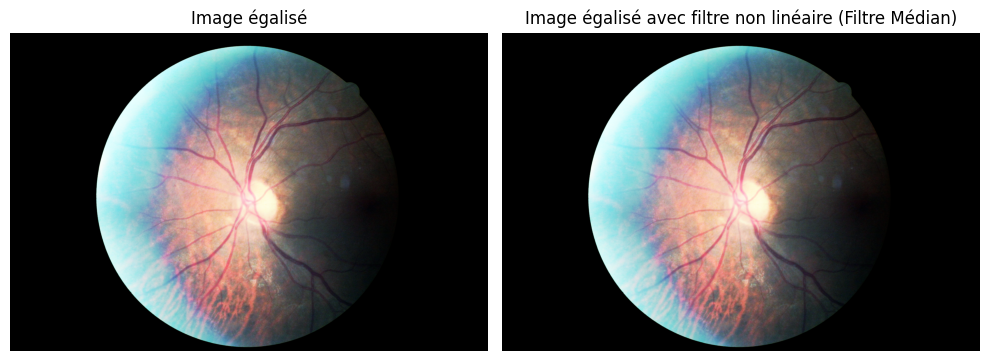

In [102]:
# Appliquer un filtre médian (noyau 3x3)
median_filtered_image = cv2.medianBlur(equalized_image, 3)

# Afficher l'image originale et l'image avec filtre non linéaire
plt.figure(figsize=(10, 5))

plt.subplot(121)
plt.imshow(cv2.cvtColor(equalized_image, cv2.COLOR_BGR2RGB))
plt.title('Image égalisé')
plt.axis('off')

plt.subplot(122)
plt.imshow(cv2.cvtColor(median_filtered_image, cv2.COLOR_BGR2RGB))
plt.title('Image égalisé avec filtre non linéaire (Filtre Médian)')
plt.axis('off')

plt.tight_layout()
plt.show()


---  
> On remarque que le filtrage median n'a pas donner des bonnes résultas.

---



#### 4-*Détection de Contours*



*   l'Opérateur de Canny



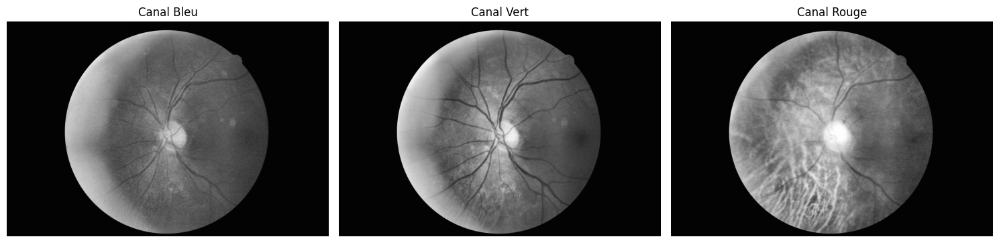

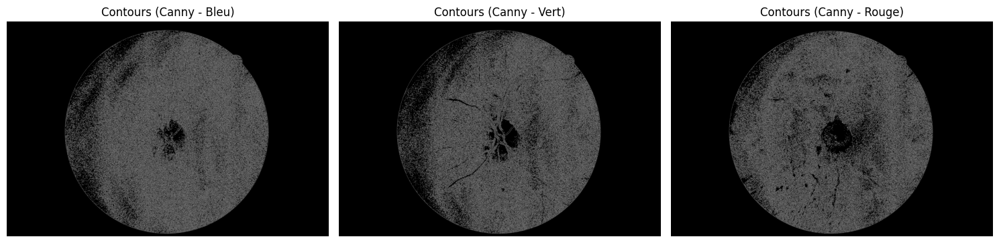

In [103]:
# Séparer les canaux de couleur
blue, green, red = cv2.split(clahe_image)

# Appliquer l'opérateur de Canny à chaque canal
edges_blue = cv2.Canny(blue, 30, 60)
edges_green = cv2.Canny(green, 30, 60)
edges_red = cv2.Canny(red, 30, 60)

# Afficher les résultats
plt.figure(figsize=(15, 5))

# Afficher les images originales
plt.subplot(131)
plt.imshow(cv2.cvtColor(blue, cv2.COLOR_BGR2RGB))
plt.title('Canal Bleu')
plt.axis('off')

plt.subplot(132)
plt.imshow(cv2.cvtColor(green, cv2.COLOR_BGR2RGB))
plt.title('Canal Vert')
plt.axis('off')

plt.subplot(133)
plt.imshow(cv2.cvtColor(red, cv2.COLOR_BGR2RGB))
plt.title('Canal Rouge')
plt.axis('off')

plt.tight_layout()

# Afficher les contours avec Canny
plt.figure(figsize=(15, 5))

plt.subplot(131)
plt.imshow(cv2.cvtColor(edges_blue, cv2.COLOR_BGR2RGB))
plt.title('Contours (Canny - Bleu)')
plt.axis('off')

plt.subplot(132)
plt.imshow(cv2.cvtColor(edges_green, cv2.COLOR_BGR2RGB))
plt.title('Contours (Canny - Vert)')
plt.axis('off')

plt.subplot(133)
plt.imshow(cv2.cvtColor(edges_red, cv2.COLOR_BGR2RGB))
plt.title('Contours (Canny - Rouge)')
plt.axis('off')

plt.tight_layout()
plt.show()

---  
> On a commencé par l'Opérateur de Canny , mais les résultats ne sont pas significatif , car la zone qu'on veut détécter est n'est pas détécté , mais la parftie qui est eclairé qui est détécté.
---



*   l'Opérateur Sobel


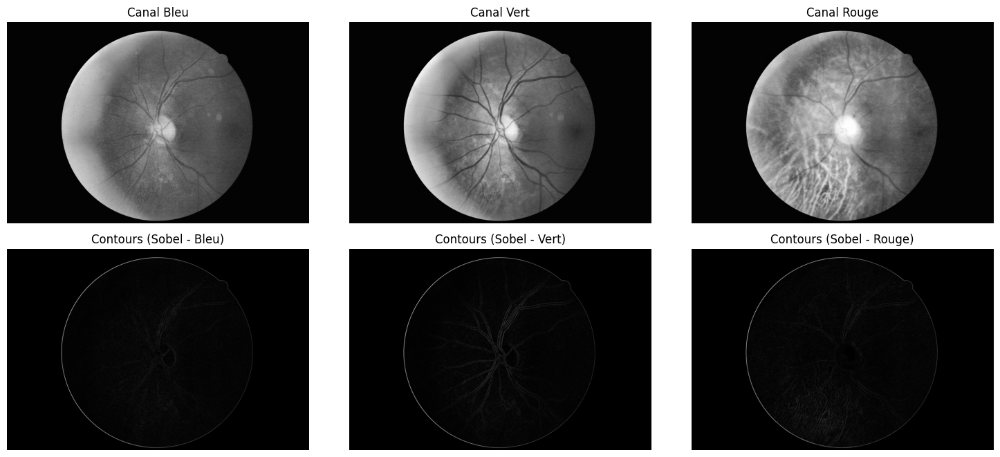

In [104]:

# Appliquer les opérateurs Sobel sur chaque canal
sobel_x_blue = cv2.Sobel(blue, cv2.CV_64F, 1, 0, ksize=25)
sobel_y_blue = cv2.Sobel(blue, cv2.CV_64F, 0, 1, ksize=25)

sobel_x_green = cv2.Sobel(green, cv2.CV_64F, 1, 0, ksize=25)
sobel_y_green = cv2.Sobel(green, cv2.CV_64F, 0, 1, ksize=25)

sobel_x_red = cv2.Sobel(red, cv2.CV_64F, 1, 0, ksize=25)
sobel_y_red = cv2.Sobel(red, cv2.CV_64F, 0, 1, ksize=25)


# Calculer le gradient total (norme) pour chaque canal
gradient_magnitude_blue_sobel = cv2.magnitude(sobel_x_blue, sobel_y_blue)
gradient_magnitude_green_sobel = cv2.magnitude(sobel_x_green, sobel_y_green)
gradient_magnitude_red_sobel = cv2.magnitude(sobel_x_red, sobel_y_red)


# Afficher les résultats
plt.figure(figsize=(15, 10))

# Afficher les images originales
plt.subplot(331)
plt.imshow(cv2.cvtColor(blue, cv2.COLOR_BGR2RGB))
plt.title('Canal Bleu')
plt.axis('off')

plt.subplot(332)
plt.imshow(cv2.cvtColor(green, cv2.COLOR_BGR2RGB))
plt.title('Canal Vert')
plt.axis('off')

plt.subplot(333)
plt.imshow(cv2.cvtColor(red, cv2.COLOR_BGR2RGB))
plt.title('Canal Rouge')
plt.axis('off')

# Afficher les contours avec Sobel
plt.subplot(334)
plt.imshow(gradient_magnitude_blue_sobel, cmap='gray')
plt.title('Contours (Sobel - Bleu)')
plt.axis('off')

plt.subplot(335)
plt.imshow(gradient_magnitude_green_sobel, cmap='gray')
plt.title('Contours (Sobel - Vert)')
plt.axis('off')

plt.subplot(336)
plt.imshow(gradient_magnitude_red_sobel, cmap='gray')
plt.title('Contours (Sobel - Rouge)')
plt.axis('off')

plt.tight_layout()
plt.show()


---  
> Pour le cas de l'opérateur de  Sobel , les contours ne sont pas bien visible.
---





*   Approche Laplacien



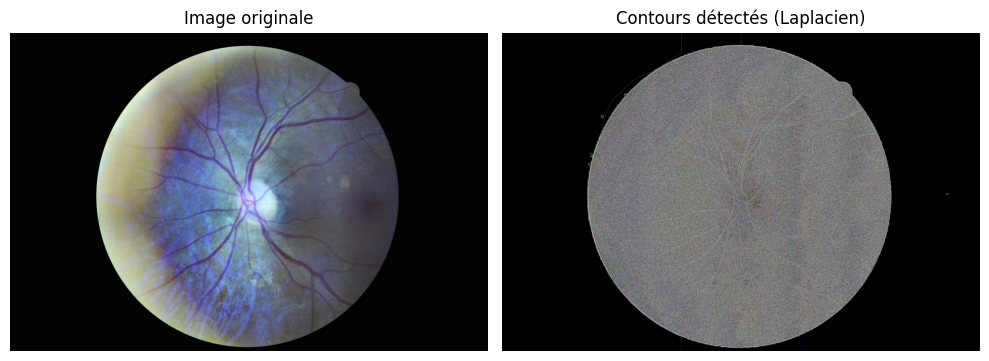

In [105]:
# Appliquer l'opérateur Laplacien
laplacian = cv2.Laplacian(clahe_image, cv2.CV_64F)

# Afficher l'image originale et les contours détectés avec l'opérateur Laplacien
plt.figure(figsize=(10, 5))

plt.subplot(121)
plt.imshow(clahe_image, cmap='gray')
plt.title('Image originale')
plt.axis('off')

plt.subplot(122)
plt.imshow(laplacian, cmap='gray')
plt.title('Contours détectés (Laplacien)')
plt.axis('off')

plt.tight_layout()
plt.show()

---  
> Enfin Pour l'approche laplacienne , les contours ne sont pas visibles.
---



#### 5-*Segmentation*

###### 5-1 Segmentation basée sur l’intensité (Thresholding)

---



---



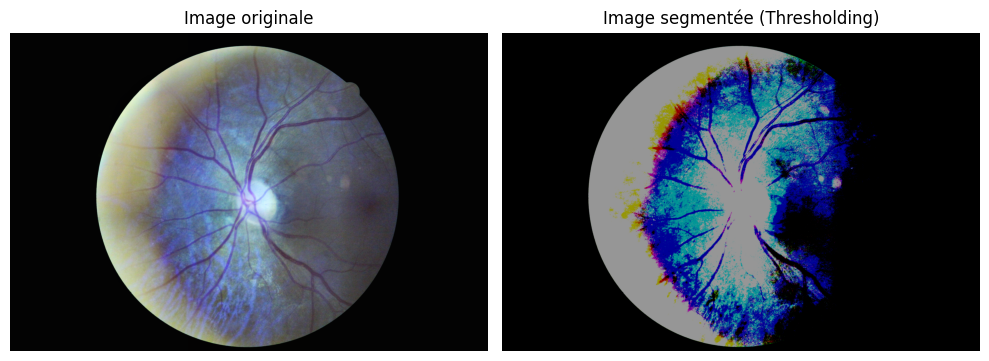

In [106]:
# Appliquer la segmentation par seuillage (Thresholding)
ret, thresholded_image = cv2.threshold(clahe_image, 100, 150, cv2.THRESH_BINARY)

# Afficher l'image originale et l'image segmentée
plt.figure(figsize=(10, 5))

plt.subplot(121)
plt.imshow(clahe_image, cmap='gray')
plt.title('Image originale')
plt.axis('off')

plt.subplot(122)
plt.imshow(thresholded_image, cmap='gray')
plt.title('Image segmentée (Thresholding)')
plt.axis('off')

plt.tight_layout()
plt.show()

---  
> En commencant par la ségmentation basée sur l'intensité , les sombres zones sont identifié un peu que précédament
---



###### 5-2 Segmentation par OTSU

---



---

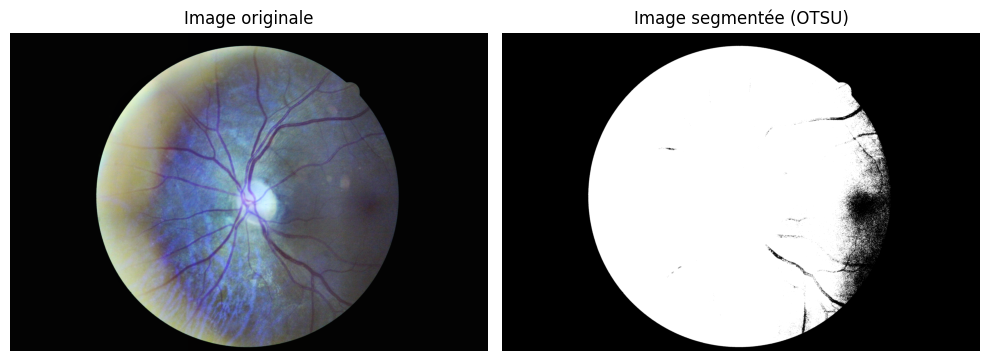

In [107]:
# Convertir l'image en niveaux de gris
clahe_gray = cv2.cvtColor(clahe_image, cv2.COLOR_BGR2GRAY)

# Appliquer la segmentation par seuillage avec la méthode d'OTSU
ret, thresholded_image_otsu = cv2.threshold(clahe_gray, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)

# Afficher l'image originale et l'image segmentée (OTSU)
plt.figure(figsize=(10, 5))

plt.subplot(121)
plt.imshow(clahe_image, cmap='gray')
plt.title('Image originale')
plt.axis('off')

plt.subplot(122)
plt.imshow(thresholded_image_otsu, cmap='gray')
plt.title('Image segmentée (OTSU)')
plt.axis('off')

plt.tight_layout()
plt.show()


---  
> pour la méthode de Otsu , l'image résultatnte n'est pas satisfaisante , même si 'elle detecte un peu la partie sombre
---



###### 5-3 Segmentation par clustring

---



---

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


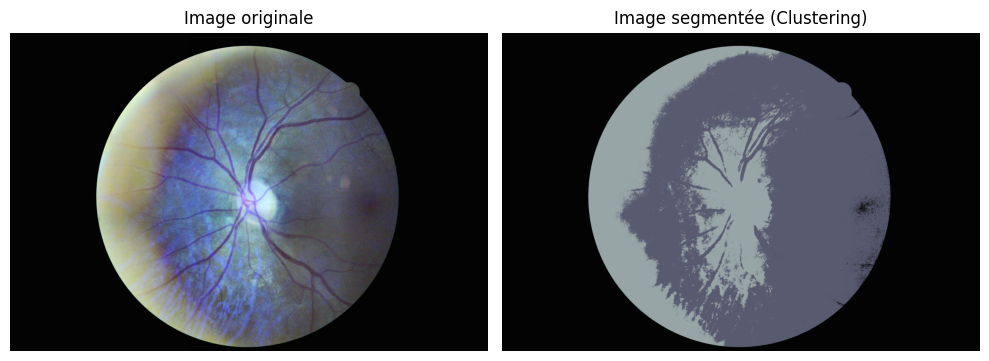

In [108]:
from sklearn.cluster import KMeans
# Convertir l'image en un tableau 2D de pixels
pixels = clahe_image.reshape(-1, 3)

# Appliquer K-means clustering
num_clusters = 3
kmeans = KMeans(n_clusters=num_clusters, random_state=0).fit(pixels)
clustered_pixels = kmeans.cluster_centers_[kmeans.labels_].reshape(clahe_image.shape)

# Afficher l'image originale et l'image segmentée par clustering
plt.figure(figsize=(10, 5))

plt.subplot(121)
plt.imshow(clahe_image)
plt.title('Image originale')
plt.axis('off')

plt.subplot(122)
plt.imshow(clustered_pixels.astype('uint8'))
plt.title('Image segmentée (Clustering)')
plt.axis('off')

plt.tight_layout()
plt.show()


---  
> pour la ségmentation par clustring la partie sombre est n'est pas précis
---



#### 6-*Evaluation de segmentation*

In [109]:
def jaccard_index(segmented_image1, real_image):
    intersection = np.logical_and(segmented_image1, real_image)
    union = np.logical_or(segmented_image1, real_image)
    jaccard_index = np.sum(intersection) / np.sum(union)
    return jaccard_index


# Conversion de l'image segmentée (Thresholding &Clustering) en binaire
thresholded_binary = (thresholded_image > 0).astype(np.uint8)
clustered_binary = (clustered_pixels > 0).astype(np.uint8)
real_image = (image > 0).astype(np.uint8)
# Calcul de l'indice de Jaccard pour la segmentation par seuillage
jaccard_1 = jaccard_index(thresholded_binary, real_image)
jaccard_2 = jaccard_index(clustered_binary, real_image)

# Affichage des indices de Jaccard
print(f"Indice de Jaccard pour la segmentation thresholded  : {jaccard_1}")
print(f"Indice de Jaccard pour la segmentation clustring  : {jaccard_2}")


Indice de Jaccard pour la segmentation thresholded  : 0.5857129916160867
Indice de Jaccard pour la segmentation clustring  : 0.47370246020814205


---  
> Pour l'evaluation de la ségmentation on a utilisé l'indice de Jaccard qui est:

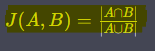

> alors plus que l'indice de jaccard est grand plus que la ségmentation est mieux , ce qui fait la ségmentation par intensité a donnée meilleur résultat pour l'image 1.
---  

#### 7-*Automatisation*

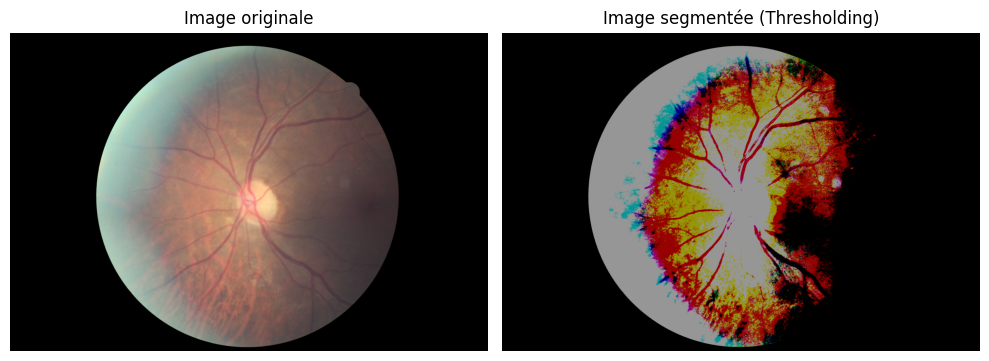

Indice de Jaccard pour la segmentation thresholded : 0.5857129916160867


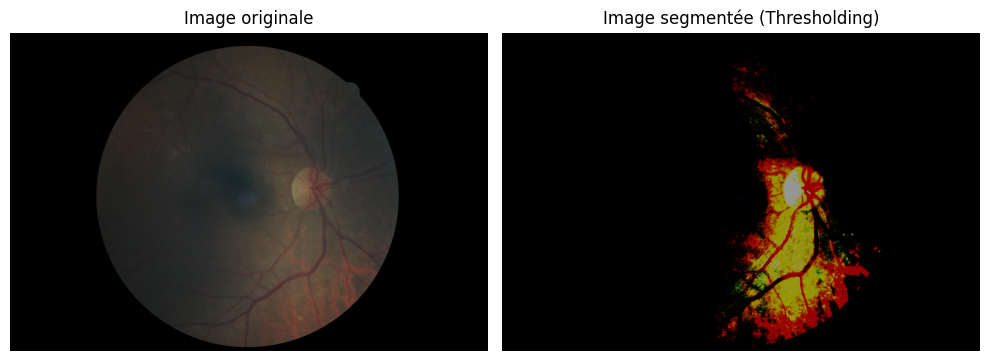

Indice de Jaccard pour la segmentation thresholded : 0.09184425477731968


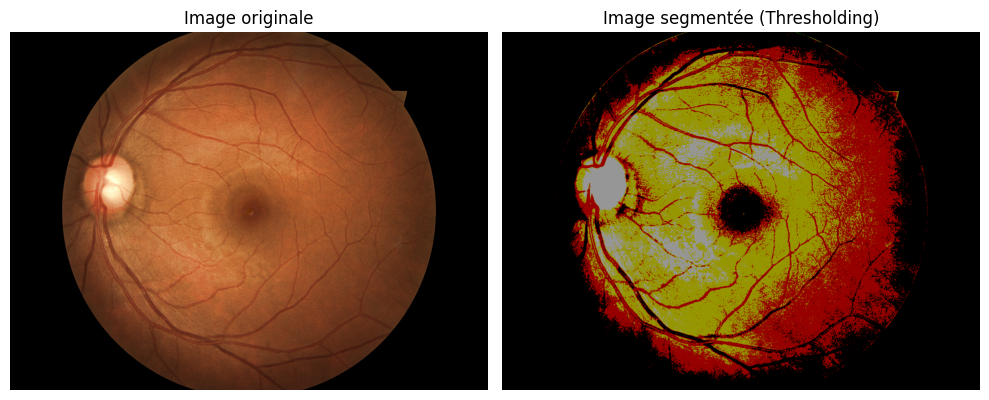

Indice de Jaccard pour la segmentation thresholded : 0.410649039071362


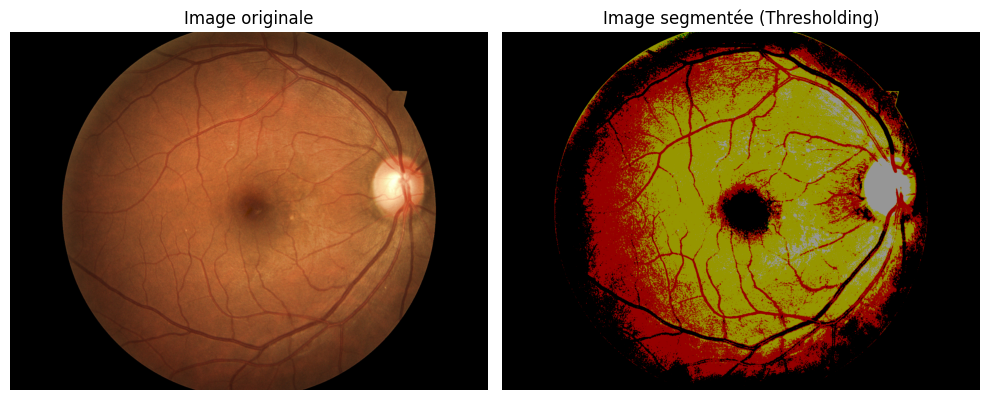

Indice de Jaccard pour la segmentation thresholded : 0.41348992308234617


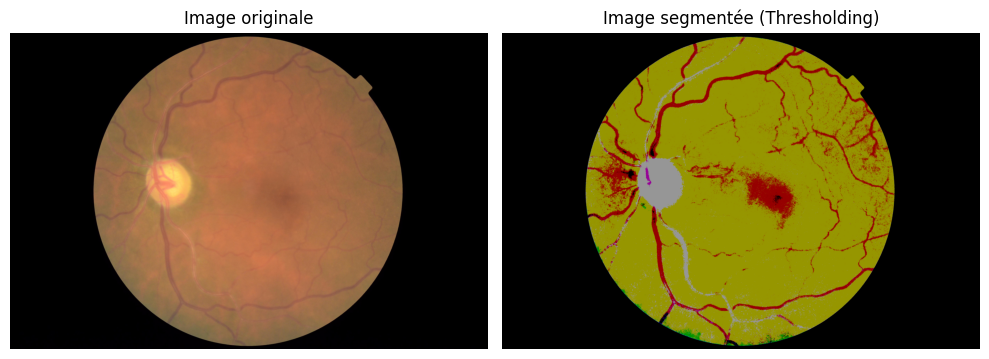

Indice de Jaccard pour la segmentation thresholded : 0.6051580234909718


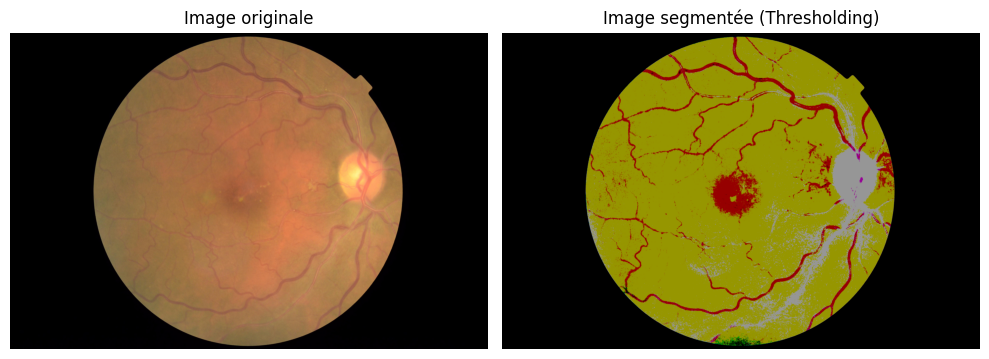

Indice de Jaccard pour la segmentation thresholded : 0.6212630784498029


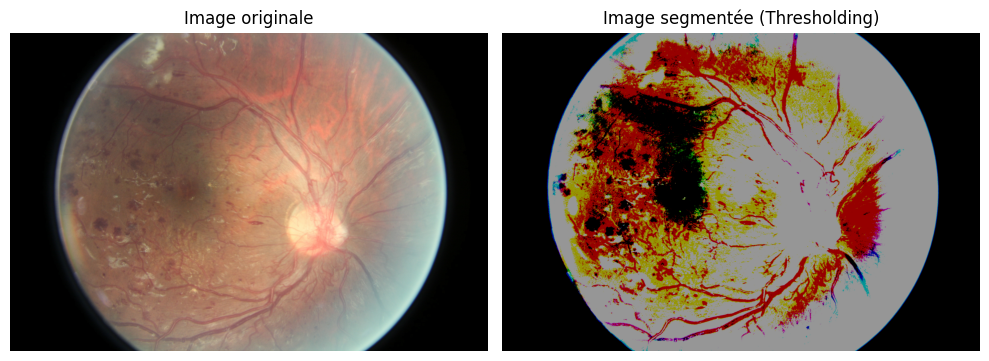

Indice de Jaccard pour la segmentation thresholded : 0.6648152315663147


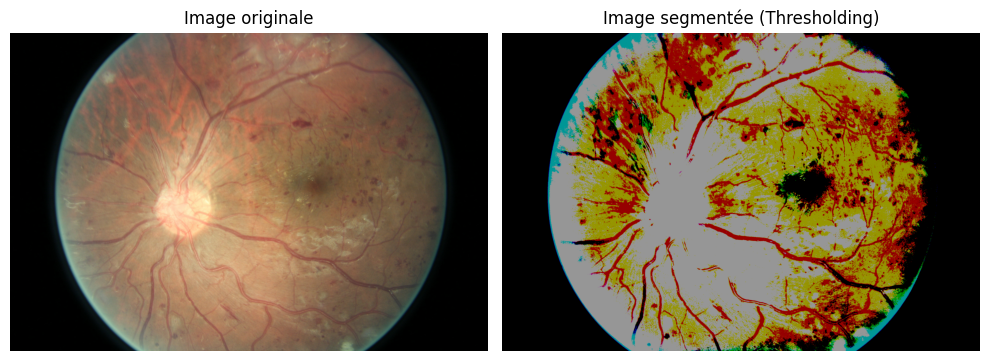

Indice de Jaccard pour la segmentation thresholded : 0.5993214678194404


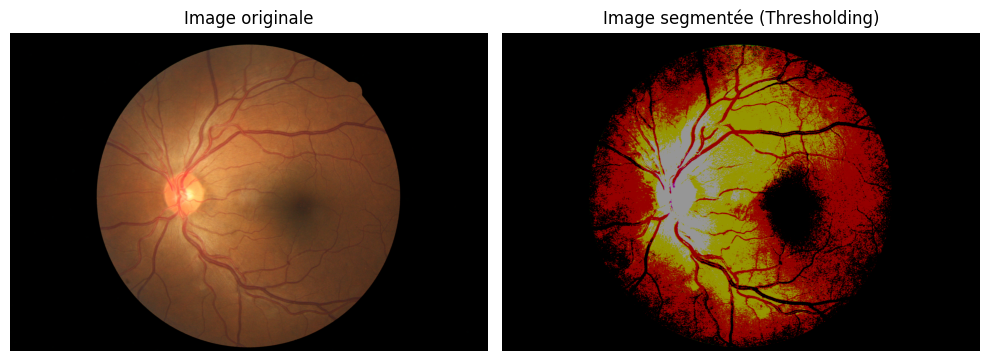

Indice de Jaccard pour la segmentation thresholded : 0.38573641174921114


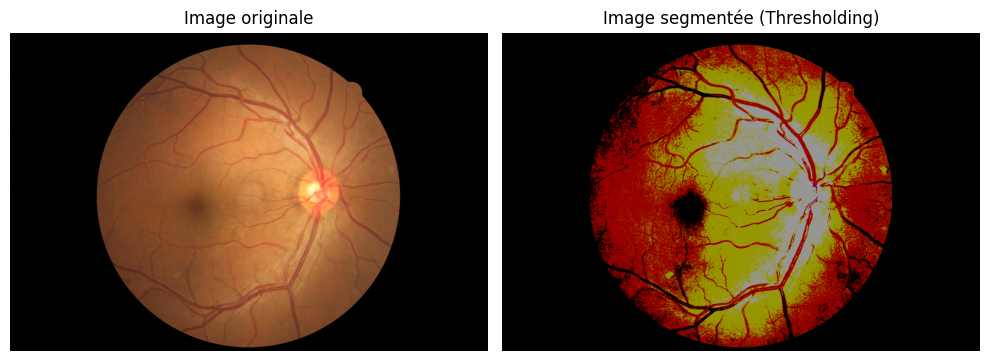

Indice de Jaccard pour la segmentation thresholded : 0.5004186256465228


In [110]:
def traitement_image(image_path):
    # Étape 1 : Amélioration du Contraste avec CLAHE
    image = cv2.imread(image_path)
    blue, green, red = cv2.split(image)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    blue_clahe = clahe.apply(blue)
    green_clahe = clahe.apply(green)
    red_clahe = clahe.apply(red)
    clahe_image = cv2.merge((blue_clahe, green_clahe, red_clahe))

    # Étape 2 : Segmentation basée sur l’intensité (Thresholding)
    ret, thresholded_image = cv2.threshold(clahe_image, 100, 150, cv2.THRESH_BINARY)

    # Étape 3 : Évaluation avec Indice de Jaccard
    def jaccard_index(segmented_image1, real_image):
        intersection = np.logical_and(segmented_image1, real_image)
        union = np.logical_or(segmented_image1, real_image)
        jaccard_index = np.sum(intersection) / np.sum(union)
        return jaccard_index

    thresholded_binary = (thresholded_image > 0).astype(np.uint8)
    real_image = (image > 0).astype(np.uint8)
    jaccard_1 = jaccard_index(thresholded_binary, real_image)

    # Affichage des images et de l'indice de Jaccard
    plt.figure(figsize=(10, 5))

    plt.subplot(121)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title('Image originale')
    plt.axis('off')

    plt.subplot(122)
    plt.imshow(cv2.cvtColor(thresholded_image, cv2.COLOR_BGR2RGB))
    plt.title('Image segmentée (Thresholding)')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

    print(f"Indice de Jaccard pour la segmentation thresholded : {jaccard_1}")

# Exécuter la fonction sur toutes les images du dossier
dataset_path = "Diabetic_Retinopathy_Data"
image_files = sorted([f for f in os.listdir(dataset_path) if os.path.isfile(os.path.join(dataset_path, f))])

for image_file in image_files:
    image_path = os.path.join(dataset_path, image_file)
    traitement_image(image_path)


---  
> Maintenant on a créer une fonction qui porte les étapes de preprocessing réalisé sur l'image précédente et la parcourir sur l'ensemble des images.

> On remarque que les résultats sont assez bonnes , sauf pour l'image 2 qui doit être traiter .
---



##### 7-1 *Cas spéciale*

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


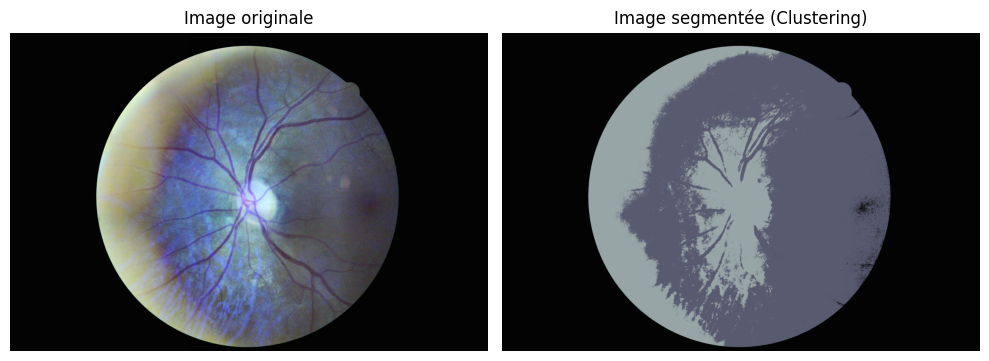

Indice de Jaccard pour la segmentation clustring  : 0.47233330871141266


In [111]:
from sklearn.cluster import KMeans
image_files = sorted([f for f in os.listdir(dataset_path) if os.path.isfile(os.path.join(dataset_path, f))])
# Sélectionner une image pour l'analyse d'histogramme
image_path = os.path.join(dataset_path, image_files[1])
image = cv2.imread(image_path)
# Convertir en float pour éviter la saturation des valeurs
image_float = image.astype(np.float32)

# Normaliser chaque canal
for i in range(3):
    min_val = np.min(image_float[:,:,i])
    max_val = np.max(image_float[:,:,i])
    image_float[:,:,i] = (image_float[:,:,i] - min_val) / (max_val - min_val) * 255

# Convertir en type d'image entier non signé 8 bits (0-255)
normalized_image = np.uint8(image_float)


# Convertir l'image en un tableau 2D de pixels
pixels = clahe_image.reshape(-1, 3)

# Appliquer K-means clustering
num_clusters = 3
kmeans = KMeans(n_clusters=num_clusters, random_state=0).fit(pixels)
clustered_pixels = kmeans.cluster_centers_[kmeans.labels_].reshape(clahe_image.shape)

# Afficher l'image originale et l'image segmentée par clustering
plt.figure(figsize=(10, 5))

plt.subplot(121)
plt.imshow(clahe_image)
plt.title('Image originale')
plt.axis('off')

plt.subplot(122)
plt.imshow(clustered_pixels.astype('uint8'))
plt.title('Image segmentée (Clustering)')
plt.axis('off')

plt.tight_layout()
plt.show()
def jaccard_index(segmented_image1, real_image):
    intersection = np.logical_and(segmented_image1, real_image)
    union = np.logical_or(segmented_image1, real_image)
    jaccard_index = np.sum(intersection) / np.sum(union)
    return jaccard_index


# Conversion de l'image segmentée (Thresholding &Clustering) en binaire
clustered_binary = (clustered_pixels > 0).astype(np.uint8)
real_image = (image > 0).astype(np.uint8)
# Calcul de l'indice de Jaccard pour la segmentation par seuillage
jaccard_2 = jaccard_index(clustered_binary, real_image)
# Affichage des indices de Jaccard
print(f"Indice de Jaccard pour la segmentation clustring  : {jaccard_2}")


---  
> Pour l'image 2 , on a réeussi a rendre l'indice de jaccard passe vers 0.4 en utilisant l'égalisation avec normalisation et ségmentation par clustring  .
---



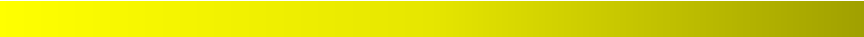

### **BraTS2020 Dataset**

---






#### 1-*Exploration des Données*

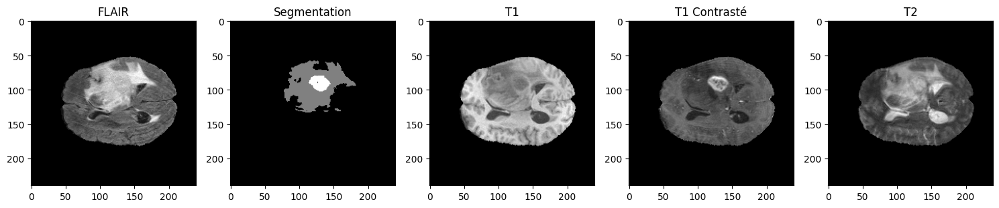

In [112]:
import nibabel as nib

dataset_path = "BraTs_001"

# Charger les fichiers NIfTI
flair_img = nib.load(os.path.join(dataset_path, "BraTS20_Training_001_flair.nii"))
seg_img = nib.load(os.path.join(dataset_path, "BraTS20_Training_001_seg.nii"))
t1_img = nib.load(os.path.join(dataset_path, "BraTS20_Training_001_t1.nii"))
t1ce_img = nib.load(os.path.join(dataset_path, "BraTS20_Training_001_t1ce.nii"))
t2_img = nib.load(os.path.join(dataset_path, "BraTS20_Training_001_t2.nii"))

# Extraire les données sous forme de tableau NumPy
flair_data = flair_img.get_fdata()
seg_data = seg_img.get_fdata()
t1_data = t1_img.get_fdata()
t1ce_data = t1ce_img.get_fdata()
t2_data = t2_img.get_fdata()

# Enregistrer les images sous format jpg
cv2.imwrite('flair_img.jpg', flair_data[:,:,50])
flair_img = cv2.imread("flair_img.jpg")
cv2.imwrite('seg_img.jpg', seg_data[:,:,50])
seg_img = cv2.imread("seg_img.jpg")
cv2.imwrite('t1_img.jpg', t1_data[:,:,50])
t1_img = cv2.imread("t1_img.jpg")
cv2.imwrite('t1ce_img.jpg', t1ce_data[:,:,50])
t1ce_img = cv2.imread("t1ce_img.jpg")
cv2.imwrite('t2_img.jpg', t2_data[:,:,50])
t2_img = cv2.imread("t2_img.jpg")

# Afficher les images
plt.figure(figsize=(15, 5))

plt.subplot(151)
plt.imshow(flair_data[:, :, flair_data.shape[2]//2], cmap='gray')
plt.title('FLAIR')

plt.subplot(152)
plt.imshow(seg_data[:, :, seg_data.shape[2]//2], cmap='gray')
plt.title('Segmentation')

plt.subplot(153)
plt.imshow(t1_data[:, :, t1_data.shape[2]//2], cmap='gray')
plt.title('T1')

plt.subplot(154)
plt.imshow(t1ce_data[:, :, t1ce_data.shape[2]//2], cmap='gray')
plt.title('T1 Contrasté')

plt.subplot(155)
plt.imshow(t2_data[:, :, t2_data.shape[2]//2], cmap='gray')
plt.title('T2')

plt.tight_layout()
plt.show()


---  
> Tous d'abord on observe les image de premiers dossier ,
---





*   Histogrammes:



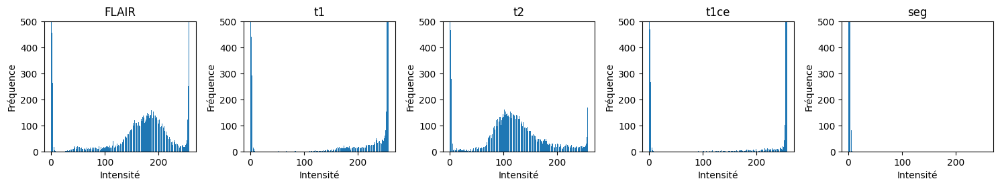

In [113]:
hist_flair = cv2.calcHist([flair_img],[0],None,[256],[0,256])
hist_t1 = cv2.calcHist([t1_img],[0],None,[256],[0,256])
hist_t2 = cv2.calcHist([t2_img],[0],None,[256],[0,256])
hist_seg = cv2.calcHist([seg_img],[0],None,[256],[0,256])
hist_t1ce = cv2.calcHist([t1ce_img],[0],None,[256],[0,256])
plt.figure(figsize=(15, 5))

plt.subplot(251)
plt.ylim(0,500)
plt.bar(range(1,257),hist_flair.reshape([256]))
plt.title('FLAIR')
plt.xlabel('Intensité')
plt.ylabel('Fréquence')

plt.subplot(252)
plt.ylim(0,500)
plt.bar(range(1,257),hist_t1.reshape([256]))
plt.title('t1')
plt.xlabel('Intensité')
plt.ylabel('Fréquence')

plt.subplot(253)
plt.ylim(0,500)
plt.bar(range(1,257),hist_t2.reshape([256]))
plt.title('t2')
plt.xlabel('Intensité')
plt.ylabel('Fréquence')

plt.subplot(254)
plt.ylim(0,500)
plt.bar(range(1,257),hist_t1ce.reshape([256]))
plt.title('t1ce')
plt.xlabel('Intensité')
plt.ylabel('Fréquence')

plt.subplot(255)
plt.ylim(0,500)
plt.bar(range(1,257),hist_seg.reshape([256]))
plt.title('seg')
plt.xlabel('Intensité')
plt.ylabel('Fréquence')


plt.tight_layout()
plt.show()

---  
> D'apres,les histogrammes , on observe qu'il sera bénéficaire de travailler avec l'image Flair ou t2 , sinon , on ne va pas observer bien nos images.
---



#### 2-*Amélioration du Contraste*

###### 2-1 L'égalisation


---



---



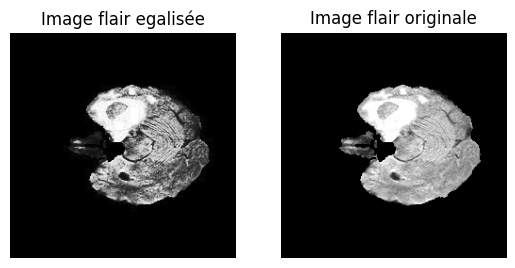

In [114]:
image_egalise = cv2.equalizeHist(flair_img[:,:,1])
cv2.imwrite('image_egalise.jpg', image_egalise)
image_egalise = cv2.imread("image_egalise.jpg")
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Image flair egalisée")
plt.imshow(image_egalise)
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Image flair originale")
plt.imshow(flair_img)

---  
> Pour l'égalisation d'histogramme , l'image est bien affiché avec ses détaills
---





*   Histogramme d'image égalisé:



<BarContainer object of 256 artists>

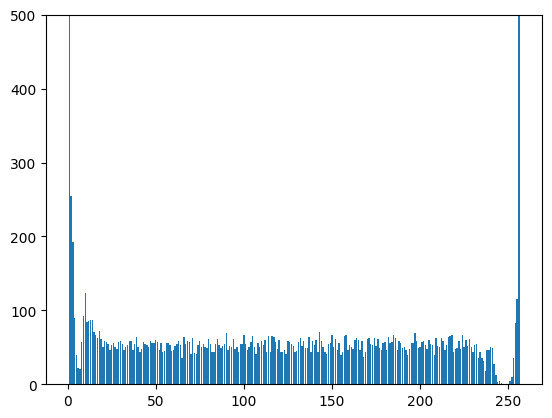

In [115]:
hist_image_egalise= cv2.calcHist([image_egalise],[0],None,[256],[0,256])
plt.ylim(0,500)
plt.bar(range(1,257),hist_image_egalise.reshape([256]))

---  
> On remarque que l'histogramme est devenu égalisé
---



###### 2-2 La normalisation d’histogramme

---

---






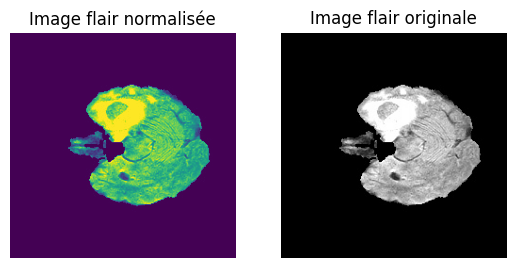

In [116]:
image_normalise = np.zeros((240, 240))
image_normalise = cv2.normalize(flair_img[:,:,1],  image_normalise, 0, 255, cv2.NORM_MINMAX)
cv2.imwrite('image_normalise.jpg', image_normalise)
normalizedImg = cv2.imread("image_normalise.jpg")
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Image flair normalisée")
plt.imshow(image_normalise)
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Image flair originale")
plt.imshow(flair_img)

---  
> Pour la normalisation , l'image a changé seulement du couleur , alors on va travalier avec la méthode de égalisation d'histogramme
---





*   Histogramme de l'image normalisé:



<BarContainer object of 256 artists>

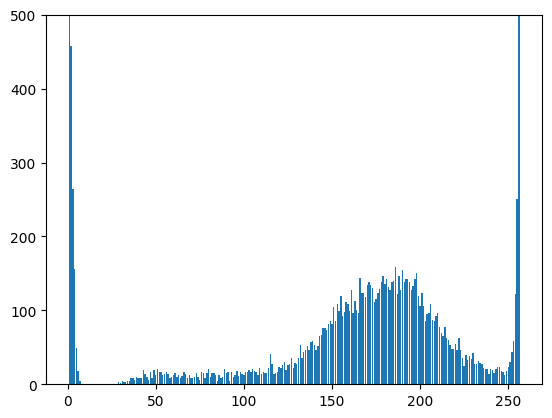

In [117]:
hist_image_normalise= cv2.calcHist([image_normalise],[0],None,[256],[0,256])
plt.ylim(0,500)
plt.bar(range(1,257),hist_image_normalise.reshape([256]))

---  
> Pour la normalisation , l'histogramme suit une distribution normal/gaussian
---



#### 3-*Réduction du Bruit*

###### 3-1 Filtrage Lineaire (Filtre Moyenneur)

---



---







*   Image égalisé



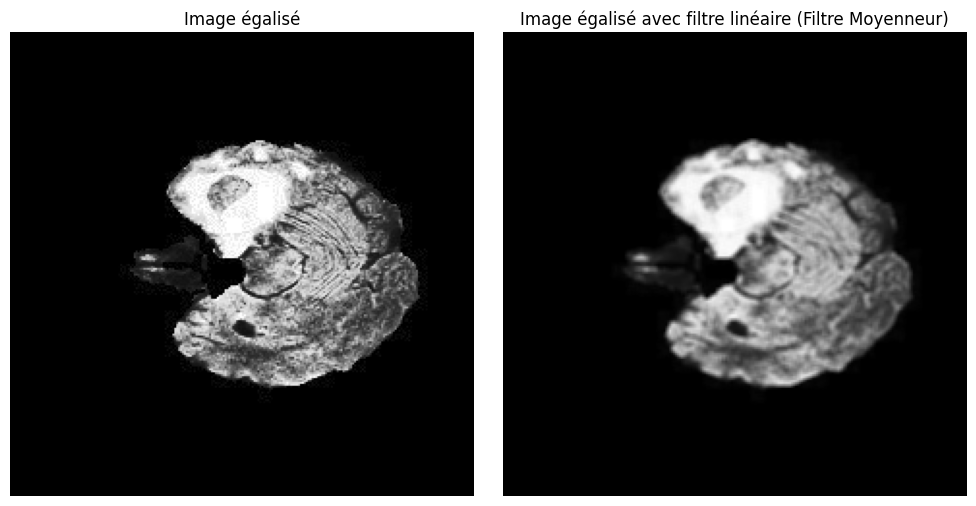

In [118]:
# Appliquer un filtre moyenneur (noyau 3x3)
blurred_image = cv2.blur(image_egalise, (3, 3))

plt.figure(figsize=(10, 5))

plt.subplot(121)
plt.imshow(cv2.cvtColor(image_egalise, cv2.COLOR_BGR2RGB))
plt.title('Image égalisé')
plt.axis('off')

plt.subplot(122)
plt.imshow(cv2.cvtColor(blurred_image, cv2.COLOR_BGR2RGB))
plt.title('Image égalisé avec filtre linéaire (Filtre Moyenneur)')
plt.axis('off')

plt.tight_layout()
plt.show()


---  
> Pour le filtre moyanneur de l'image égalisé , on remarque que l'image a devenu floué , ce qui n'est pas bon
---



*   Image normalisé


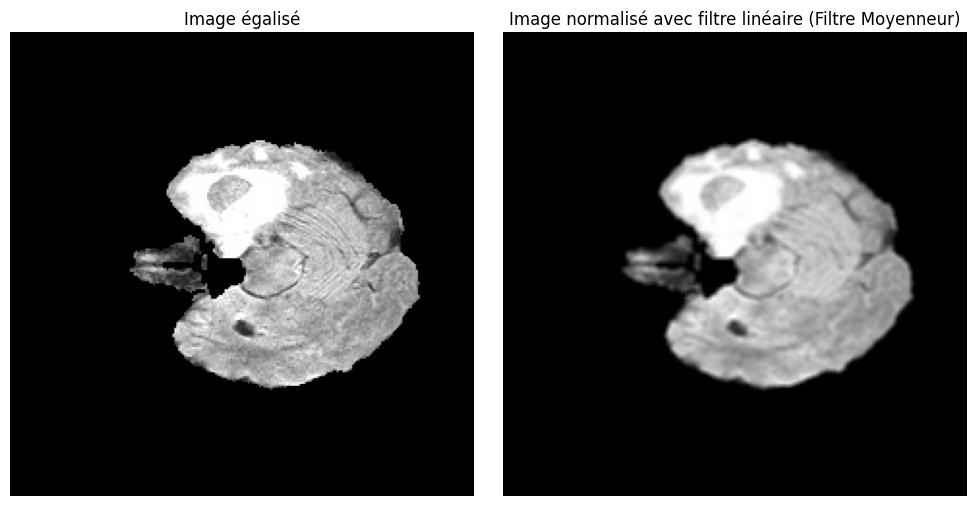

In [119]:
# Appliquer un filtre moyenneur (noyau 3x3)
blurred_image = cv2.blur(image_normalise, (3, 3))

plt.figure(figsize=(10, 5))

plt.subplot(121)
plt.imshow(cv2.cvtColor(image_normalise, cv2.COLOR_BGR2RGB))
plt.title('Image égalisé')
plt.axis('off')

plt.subplot(122)
plt.imshow(cv2.cvtColor(blurred_image, cv2.COLOR_BGR2RGB))
plt.title('Image normalisé avec filtre linéaire (Filtre Moyenneur)')
plt.axis('off')

plt.tight_layout()
plt.show()

---  
> Pour le filtre moyanneur de l'image normalisé , on remarque que l'image a devenu floué , ce qui n'est pas bon
---

###### 3-2 Filtrage Non Lineaire (Filtre Médian)

---



---





*   Image égalisé


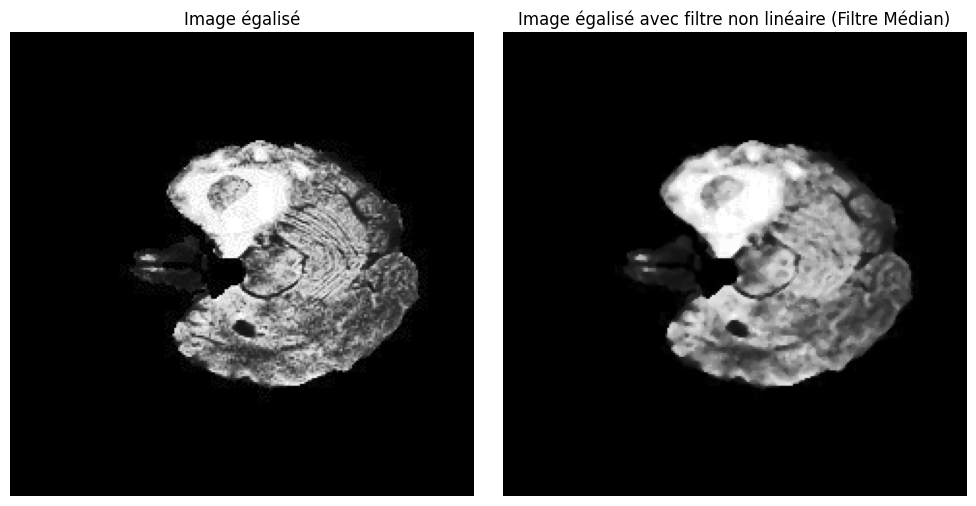

In [120]:
# Appliquer un filtre médian (noyau 3x3)
median_filtered_image = cv2.medianBlur(image_egalise, 3)

# Afficher l'image originale et l'image avec filtre non linéaire
plt.figure(figsize=(10, 5))

plt.subplot(121)
plt.imshow(cv2.cvtColor(image_egalise, cv2.COLOR_BGR2RGB))
plt.title('Image égalisé')
plt.axis('off')

plt.subplot(122)
plt.imshow(cv2.cvtColor(median_filtered_image, cv2.COLOR_BGR2RGB))
plt.title('Image égalisé avec filtre non linéaire (Filtre Médian)')
plt.axis('off')

plt.tight_layout()
plt.show()


---  
> Pour le filtre médianne de l'image égalisé , on remarque que l'image a devenu floué , ce qui n'est pas bon
---

*   Image normalisé


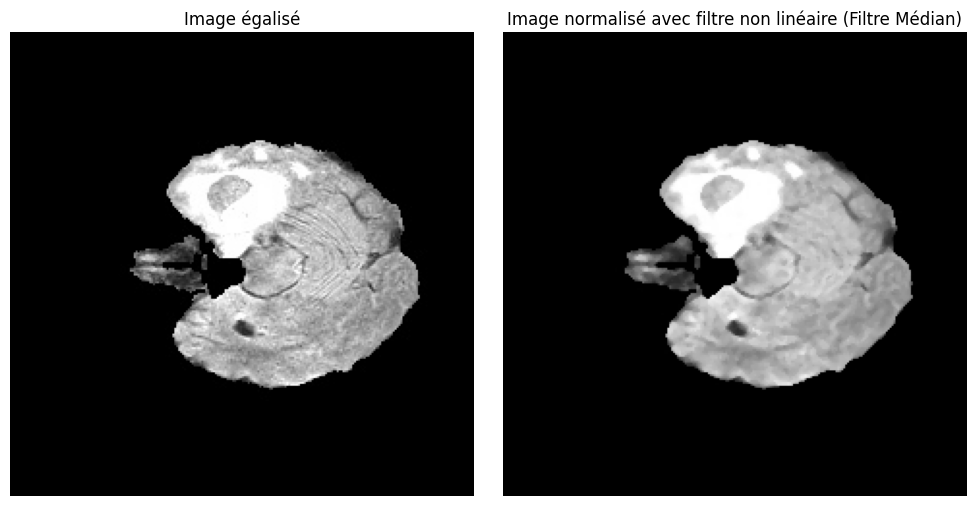

In [121]:
# Appliquer un filtre médian (noyau 3x3)
median_filtered_image = cv2.medianBlur(image_normalise, 3)

# Afficher l'image originale et l'image avec filtre non linéaire
plt.figure(figsize=(10, 5))

plt.subplot(121)
plt.imshow(cv2.cvtColor(image_normalise, cv2.COLOR_BGR2RGB))
plt.title('Image égalisé')
plt.axis('off')

plt.subplot(122)
plt.imshow(cv2.cvtColor(median_filtered_image, cv2.COLOR_BGR2RGB))
plt.title('Image normalisé avec filtre non linéaire (Filtre Médian)')
plt.axis('off')

plt.tight_layout()
plt.show()


---  
> Pour le filtre médianne de l'image normalisé , on remarque que l'image a devenu floué , ce qui n'est pas bon
---

#### 4-*Détection de Contours*



*   l'Opérateur de Canny



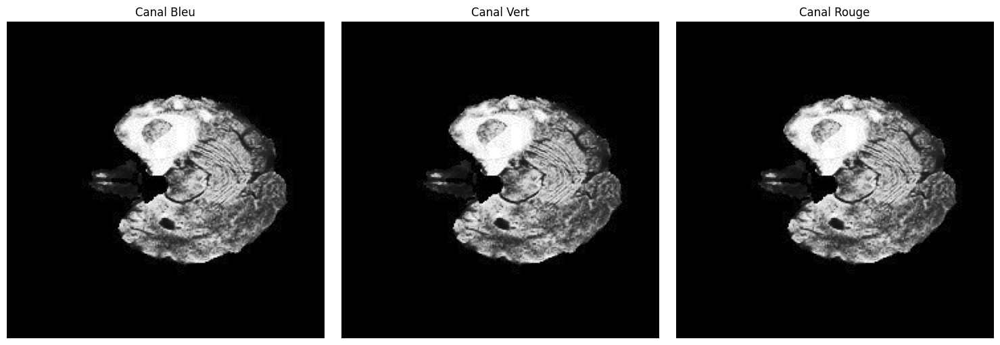

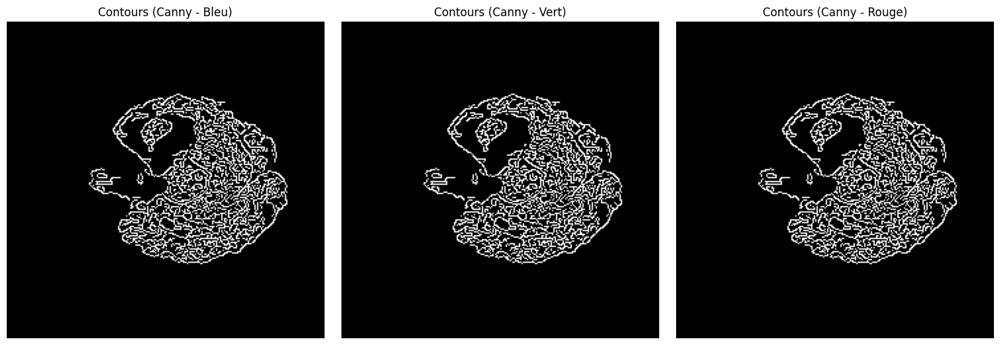

In [122]:
# Séparer les canaux de couleur
blue, green, red = cv2.split(image_egalise)

# Appliquer l'opérateur de Canny à chaque canal
edges_blue = cv2.Canny(blue, 90, 245)
edges_green = cv2.Canny(green, 90, 245)
edges_red = cv2.Canny(red, 90, 245)

# Afficher les résultats
plt.figure(figsize=(15, 5))

# Afficher les images originales
plt.subplot(131)
plt.imshow(cv2.cvtColor(blue, cv2.COLOR_BGR2RGB))
plt.title('Canal Bleu')
plt.axis('off')

plt.subplot(132)
plt.imshow(cv2.cvtColor(green, cv2.COLOR_BGR2RGB))
plt.title('Canal Vert')
plt.axis('off')

plt.subplot(133)
plt.imshow(cv2.cvtColor(red, cv2.COLOR_BGR2RGB))
plt.title('Canal Rouge')
plt.axis('off')

plt.tight_layout()

# Afficher les contours avec Canny
plt.figure(figsize=(15, 5))

plt.subplot(131)
plt.imshow(cv2.cvtColor(edges_blue, cv2.COLOR_BGR2RGB))
plt.title('Contours (Canny - Bleu)')
plt.axis('off')

plt.subplot(132)
plt.imshow(cv2.cvtColor(edges_green, cv2.COLOR_BGR2RGB))
plt.title('Contours (Canny - Vert)')
plt.axis('off')

plt.subplot(133)
plt.imshow(cv2.cvtColor(edges_red, cv2.COLOR_BGR2RGB))
plt.title('Contours (Canny - Rouge)')
plt.axis('off')

plt.tight_layout()
plt.show()

---  
> Pour l'operateur Canny , la détéction de contour est bonne
---

*   l'Opérateur Sobel


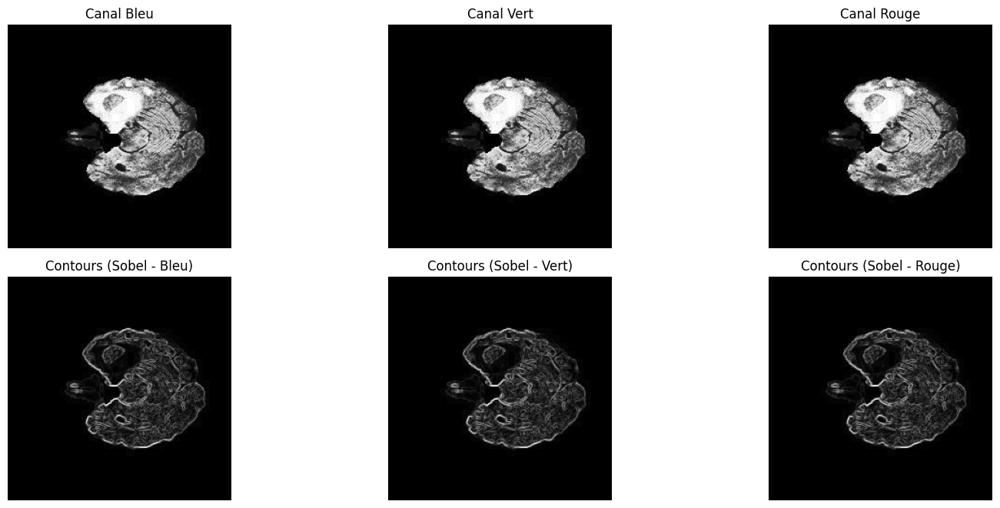

In [123]:
# Appliquer les opérateurs Sobel sur chaque canal
sobel_x_blue = cv2.Sobel(blue, cv2.CV_64F, 1, 0, ksize=3)
sobel_y_blue = cv2.Sobel(blue, cv2.CV_64F, 0, 1, ksize=3)

sobel_x_green = cv2.Sobel(green, cv2.CV_64F, 1, 0, ksize=3)
sobel_y_green = cv2.Sobel(green, cv2.CV_64F, 0, 1, ksize=3)

sobel_x_red = cv2.Sobel(red, cv2.CV_64F, 1, 0, ksize=3)
sobel_y_red = cv2.Sobel(red, cv2.CV_64F, 0, 1, ksize=3)


# Calculer le gradient total (norme) pour chaque canal
gradient_magnitude_blue_sobel = cv2.magnitude(sobel_x_blue, sobel_y_blue)
gradient_magnitude_green_sobel = cv2.magnitude(sobel_x_green, sobel_y_green)
gradient_magnitude_red_sobel = cv2.magnitude(sobel_x_red, sobel_y_red)


# Afficher les résultats
plt.figure(figsize=(15, 10))

# Afficher les images originales
plt.subplot(331)
plt.imshow(cv2.cvtColor(blue, cv2.COLOR_BGR2RGB))
plt.title('Canal Bleu')
plt.axis('off')

plt.subplot(332)
plt.imshow(cv2.cvtColor(green, cv2.COLOR_BGR2RGB))
plt.title('Canal Vert')
plt.axis('off')

plt.subplot(333)
plt.imshow(cv2.cvtColor(red, cv2.COLOR_BGR2RGB))
plt.title('Canal Rouge')
plt.axis('off')

# Afficher les contours avec Sobel
plt.subplot(334)
plt.imshow(gradient_magnitude_blue_sobel, cmap='gray')
plt.title('Contours (Sobel - Bleu)')
plt.axis('off')

plt.subplot(335)
plt.imshow(gradient_magnitude_green_sobel, cmap='gray')
plt.title('Contours (Sobel - Vert)')
plt.axis('off')

plt.subplot(336)
plt.imshow(gradient_magnitude_red_sobel, cmap='gray')
plt.title('Contours (Sobel - Rouge)')
plt.axis('off')

plt.tight_layout()
plt.show()


---  
> Pour l'operateur Soble , la détéction de contour est assez bonne
---



*   Approche Laplacien



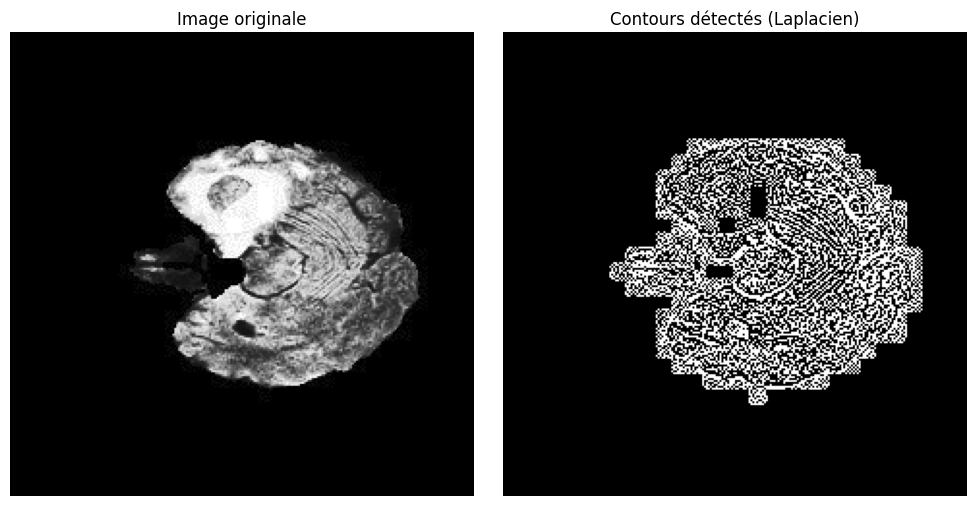

In [124]:
# Appliquer l'opérateur Laplacien
laplacian = cv2.Laplacian(image_egalise, cv2.CV_64F)

# Afficher l'image originale et les contours détectés avec l'opérateur Laplacien
plt.figure(figsize=(10, 5))

plt.subplot(121)
plt.imshow(image_egalise, cmap='gray')
plt.title('Image originale')
plt.axis('off')

plt.subplot(122)
plt.imshow(laplacian, cmap='gray')
plt.title('Contours détectés (Laplacien)')
plt.axis('off')

plt.tight_layout()
plt.show()

---  
> Pour l'operateur Laplacienne , le résultats n'est pas motivant!!
---

#### 5-*Segmentation*

###### 5-1 Segmentation basée sur l’intensité (Thresholding)

---



---



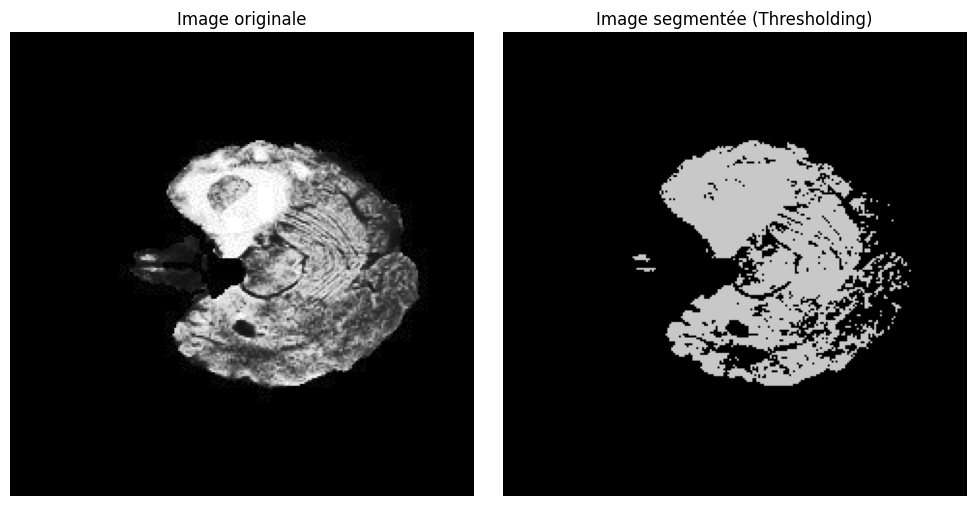

In [125]:
# Appliquer la segmentation par seuillage (Thresholding)
ret, thresholded_image = cv2.threshold(image_egalise, 100, 200, cv2.THRESH_BINARY)

# Afficher l'image originale et l'image segmentée
plt.figure(figsize=(10, 5))

plt.subplot(121)
plt.imshow(image_egalise, cmap='gray')
plt.title('Image originale')
plt.axis('off')

plt.subplot(122)
plt.imshow(thresholded_image, cmap='gray')
plt.title('Image segmentée (Thresholding)')
plt.axis('off')

plt.tight_layout()
plt.show()

---  
> Pour la ségmentation Thresholding , l'image ségmenté n'est pas assez significante
---

###### 5-2 Segmentation par OTSU

---



---

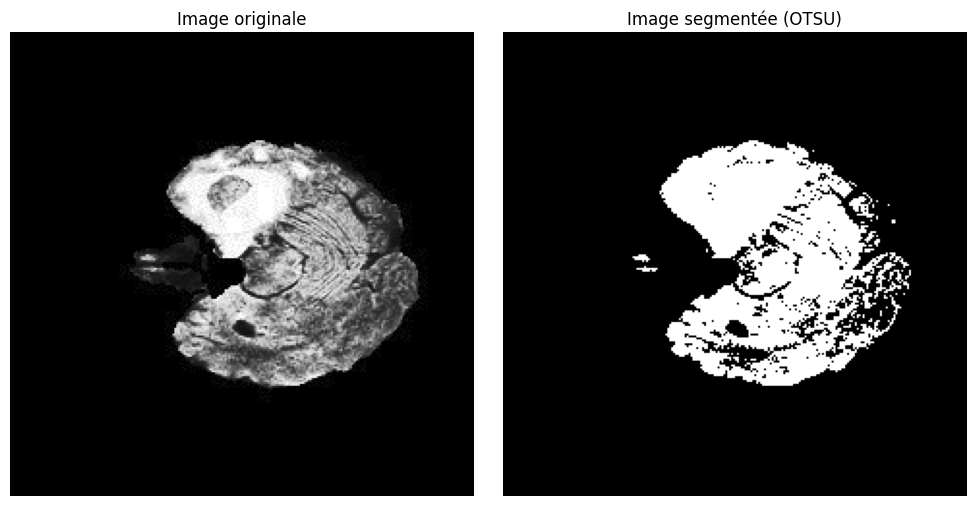

In [126]:
# Convertir l'image en niveaux de gris
clahe_gray = cv2.cvtColor(image_egalise, cv2.COLOR_BGR2GRAY)

# Appliquer la segmentation par seuillage avec la méthode d'OTSU
ret, thresholded_image_otsu = cv2.threshold(clahe_gray, 100, 240, cv2.THRESH_BINARY+cv2.THRESH_OTSU)

# Afficher l'image originale et l'image segmentée (OTSU)
plt.figure(figsize=(10, 5))

plt.subplot(121)
plt.imshow(image_egalise, cmap='gray')
plt.title('Image originale')
plt.axis('off')

plt.subplot(122)
plt.imshow(thresholded_image_otsu, cmap='gray')
plt.title('Image segmentée (OTSU)')
plt.axis('off')

plt.tight_layout()
plt.show()


---  
> Pour la ségmentation Otsu ,l'image est non significatif
---

###### 5-3 Segmentation par Clustring

---



---

---  
> Maintenant ; on procède à l'automatisation de preprocessing pour les autres images.
---

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


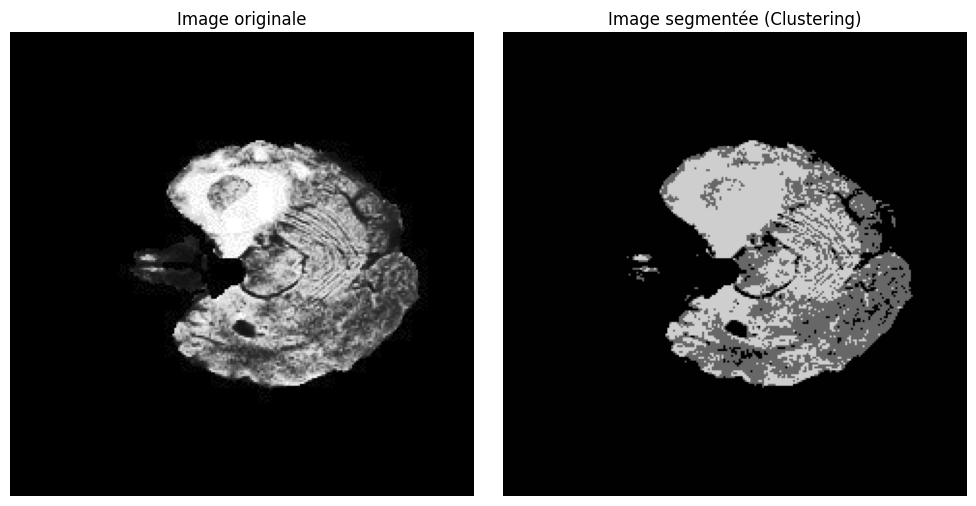

In [127]:
from sklearn.cluster import KMeans
# Convertir l'image en un tableau 2D de pixels
pixels = image_egalise.reshape(-1, 3)

# Appliquer K-means clustering
num_clusters = 3
kmeans = KMeans(n_clusters=num_clusters, random_state=0).fit(pixels)
clustered_pixels = kmeans.cluster_centers_[kmeans.labels_].reshape(image_egalise.shape)

# Afficher l'image originale et l'image segmentée par clustering
plt.figure(figsize=(10, 5))

plt.subplot(121)
plt.imshow(image_egalise)
plt.title('Image originale')
plt.axis('off')

plt.subplot(122)
plt.imshow(clustered_pixels.astype('uint8'))
plt.title('Image segmentée (Clustering)')
plt.axis('off')

plt.tight_layout()
plt.show()


---  
> Pour la ségmentation Clustring , l'image est peu significatif aussi
---

#### 6-*Evaluation de segmentation*

In [128]:
def jaccard_index(segmented_image1, real_image):
    intersection = np.logical_and(segmented_image1, real_image)
    union = np.logical_or(segmented_image1, real_image)
    jaccard_index = np.sum(intersection) / np.sum(union)
    return jaccard_index


# Conversion de l'image segmentée (Thresholding &Clustering) en binaire
thresholded_binary = (thresholded_image > 0).astype(np.uint8)
clustered_binary = (clustered_pixels > 0).astype(np.uint8)
real_image = (seg_img > 0).astype(np.uint8)
# Calcul de l'indice de Jaccard pour la segmentation par seuillage
jaccard_1 = jaccard_index(thresholded_binary, real_image)
jaccard_2 = jaccard_index(clustered_binary, real_image)

# Affichage des indices de Jaccard
print(f"Indice de Jaccard pour la segmentation thresholded  : {jaccard_1}")
print(f"Indice de Jaccard pour la segmentation clustring  : {jaccard_2}")


Indice de Jaccard pour la segmentation thresholded  : 0.2658559847401049
Indice de Jaccard pour la segmentation clustring  : 0.039878472222222225


---  
> Pour l'evaluation de la ségmentation on a utilisé l'indice de Jaccard qui est:

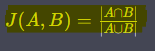

> alors plus que l'indice de jaccard est grand plus que la ségmentation est mieux , ce qui fait la ségmentation par intensité a donnée meilleur résultat pour l'image 1.
---  

#### 7-*Automatisation*

In [129]:
import os
import nibabel as nib
import cv2
import numpy as np
import matplotlib.pyplot as plt

def process_folder(folder_index):
    folder_name = f"BraTs_{folder_index:03d}"
    folder_path = f"{folder_name}/"
    # Charger les fichiers NIfTI
    flair_img = nib.load(os.path.join(folder_path, f"BraTS20_Training_{folder_index:03d}_flair.nii"))
    seg_img = nib.load(os.path.join(folder_path, f"BraTS20_Training_{folder_index:03d}_seg.nii"))

    # Extraire les données sous forme de tableau NumPy
    flair_data = flair_img.get_fdata()
    seg_data = seg_img.get_fdata()

    # Enregistrer les images sous format jpg
    cv2.imwrite('flair_img.jpg', flair_data[:, :, 50])
    flair_img = cv2.imread("flair_img.jpg")
    cv2.imwrite('seg_img.jpg', seg_data[:, :, 50])
    seg_img = cv2.imread("seg_img.jpg")

    # Égalisation d'histogramme
    image_egalise = cv2.equalizeHist(flair_img[:, :, 1])
    cv2.imwrite('image_egalise.jpg', image_egalise)
    image_egalise = cv2.imread("image_egalise.jpg")

    # Appliquer la segmentation par seuillage (Thresholding)
    ret, thresholded_image = cv2.threshold(image_egalise, 100, 200, cv2.THRESH_BINARY)

    # Afficher les images
    plt.figure(figsize=(10, 5))

    plt.subplot(131)
    plt.axis("off")
    plt.title("Image flair égalisée")
    plt.imshow(image_egalise)

    plt.subplot(132)
    plt.axis("off")
    plt.title("Image segmentée (Thresholding)")
    plt.imshow(thresholded_image, cmap='gray')

    # Calcul de l'indice de Jaccard
    thresholded_binary = (thresholded_image > 0).astype(np.uint8)
    real_image = (seg_img > 0).astype(np.uint8)
    jaccard_index_value = jaccard_index(thresholded_binary, real_image)

    plt.subplot(133)
    plt.axis("off")
    plt.title(f"Indice de Jaccard : {jaccard_index_value:.4f}")
    plt.text(0.5, 0.5, f"{jaccard_index_value:.4f}", fontsize=12, ha='center')

    plt.tight_layout()
    plt.show()

def jaccard_index(segmented_image1, real_image):
    intersection = np.logical_and(segmented_image1, real_image)
    union = np.logical_or(segmented_image1, real_image)
    jaccard_index = np.sum(intersection) / np.sum(union)
    return jaccard_index


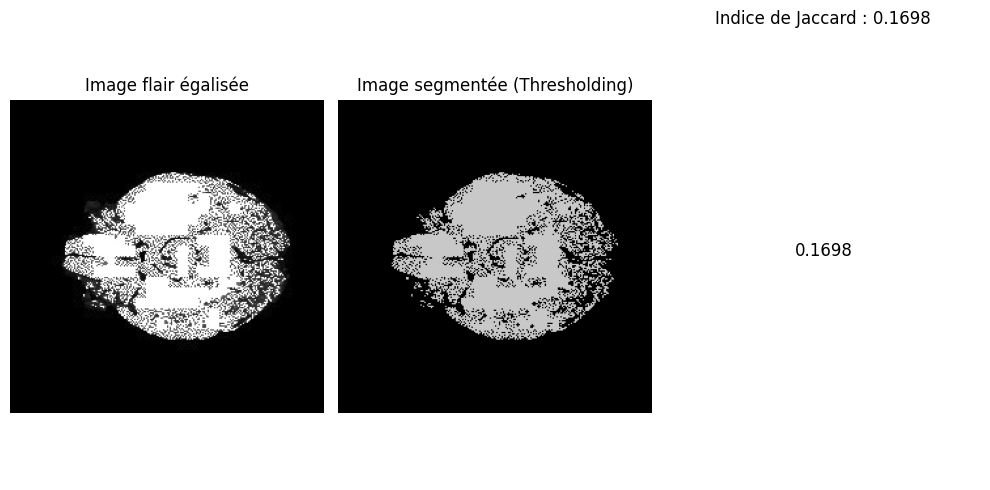

In [130]:
process_folder(2)

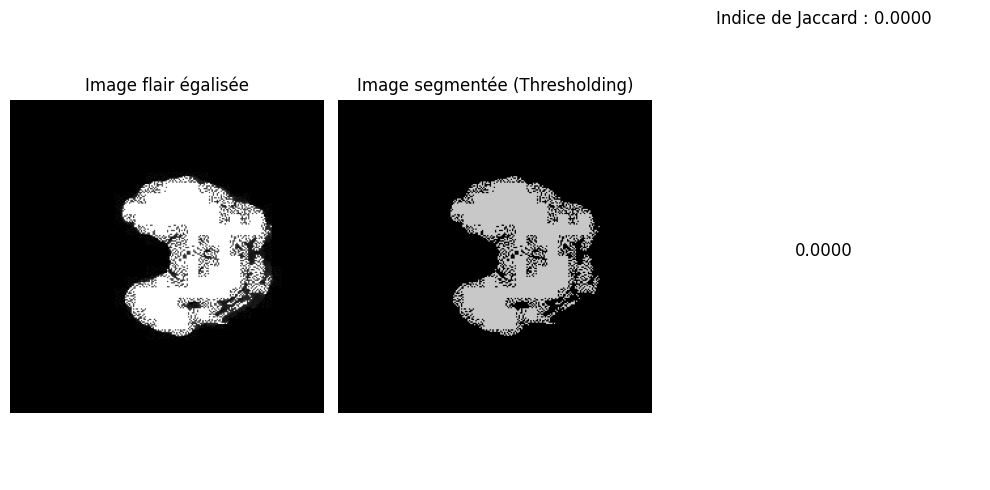

In [131]:
process_folder(3)

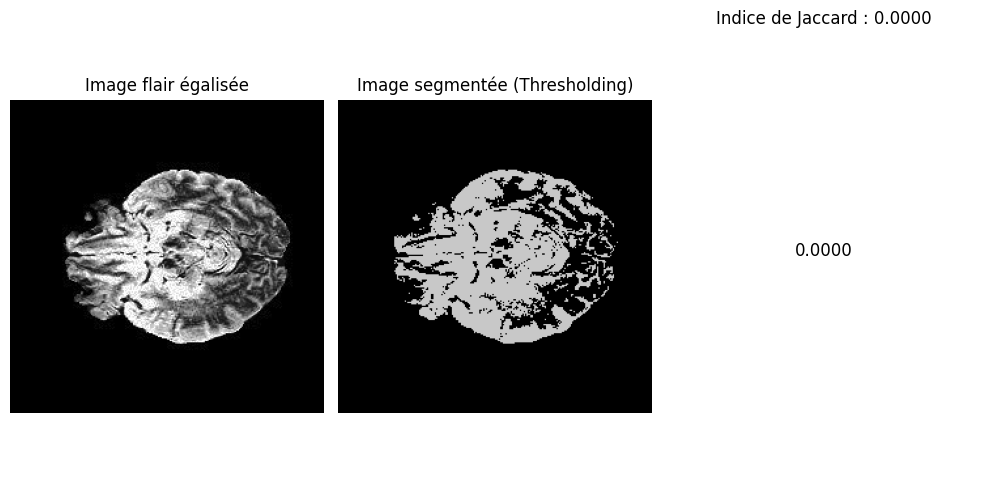

In [132]:
process_folder(4)

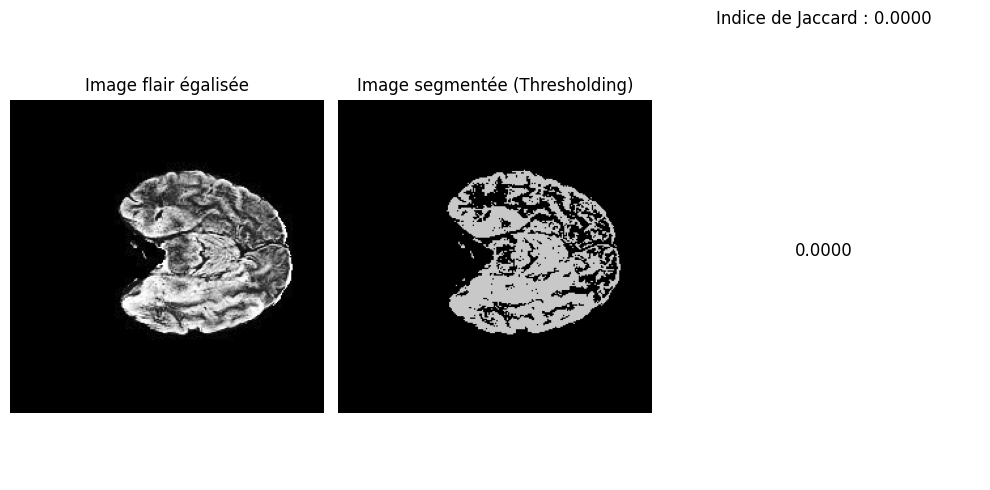

In [133]:
process_folder(5)

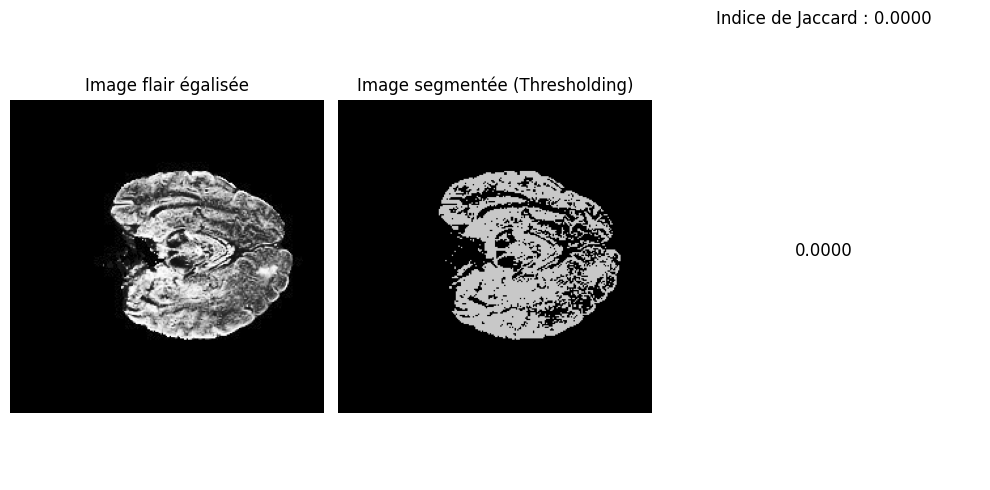

In [134]:
process_folder(6)

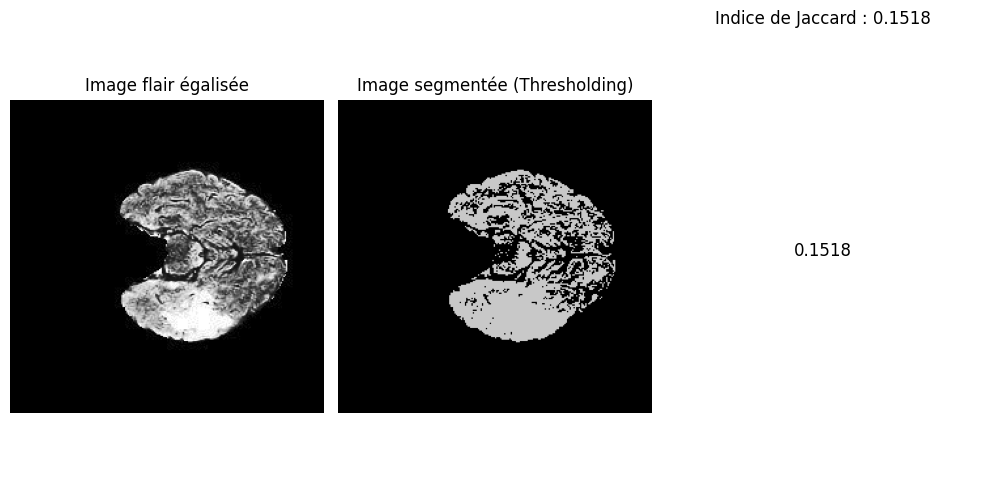

In [135]:
process_folder(7)

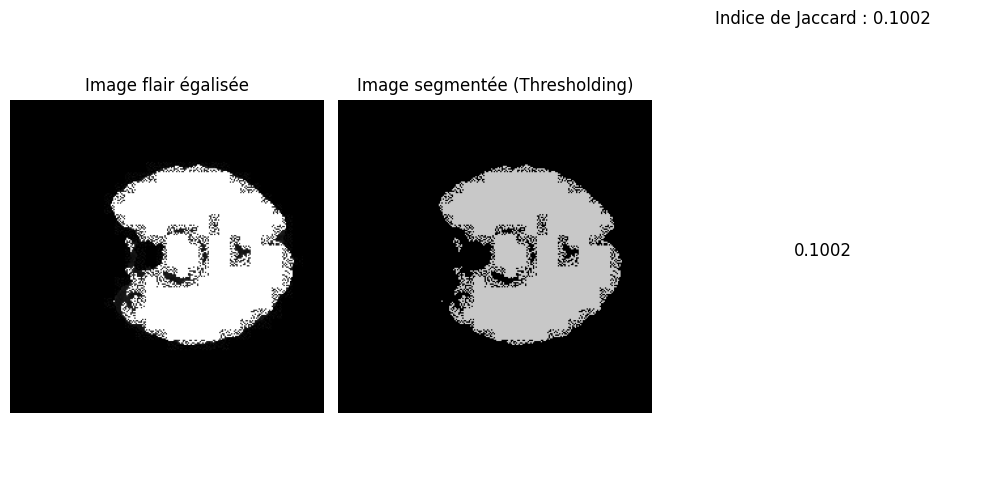

In [136]:
process_folder(8)

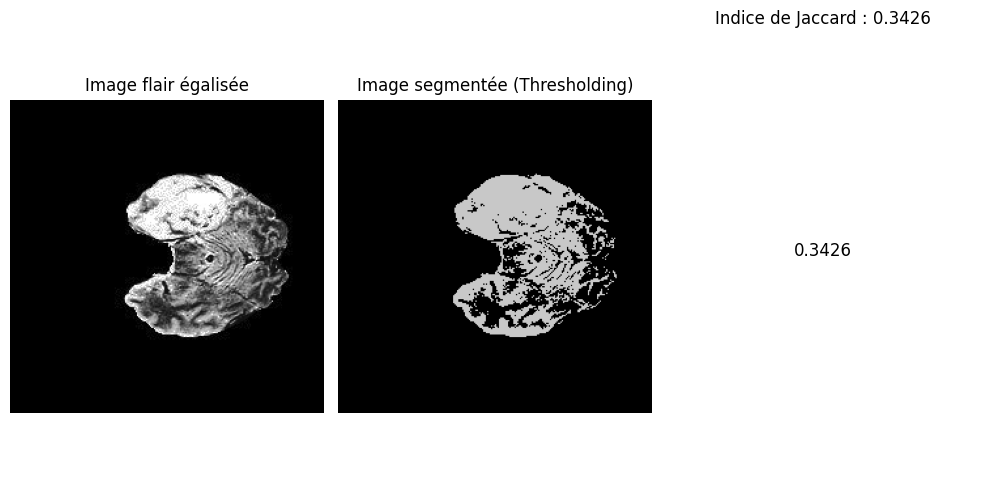

In [137]:
process_folder(9)

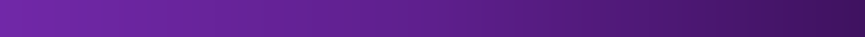

### **Discussion sur les techniques utilisées**

---






---  
>***Égalisation et Normalisation d'Histogramme:***
Nous avons choisi d'appliquer l'égalisation et la normalisation d'histogramme pour améliorer le contraste des images. Ces techniques ont été privilégiées en raison de leur capacité à accentuer les détails fins, améliorant ainsi la clarté des structures anatomiques.

> ***Réduction du Bruit***
Le bruit présent dans certaines images a été atténué en utilisant des filtres linéaires et non linéaires. Les filtres gaussiens et médians ont été appliqués pour supprimer les artefacts indésirables tout en préservant les contours des structures importantes.

> ***Détection de Contours***
Les opérateurs Sobel et Roberts ont été employés pour mettre en évidence les contours des structures, facilitant ainsi l'identification des régions d'intérêt.

> ***Segmentation***
Nous avons exploré trois techniques de segmentation : basée sur l'intensité (Thresholding), par croissance de région (Region Growing) et par clustering. Chacune de ces méthodes a été appliquée pour isoler des régions spécifiques de l'image, permettant une analyse plus ciblée.

---



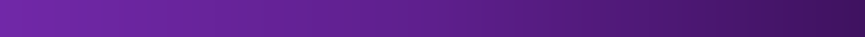

### **Réflexions sur les défis rencontrés et comment les surmonter**

---






---  
> L'un des principaux défis a été de gérer la diversité des images dans le dataset. Certaines images présentaient un contraste très faible, ce qui a rendu l'égalisation d'histogramme moins efficace. Pour surmonter cela, nous avons combiné des techniques d'égalisation avec des méthodes de filtrage adaptatif pour améliorer la qualité d'image.
---



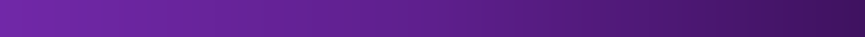

### **Conclusions et réflexions sur l’importance du traitement d’images en médecine.**

---






---  
> Ce projet met en lumière l'importance cruciale du traitement d'images en médecine. En améliorant la qualité des images médicales, nous avons augmenté la précision du diagnostic, ce qui a des implications directes sur la prise en charge clinique des patients. Il est impératif d'adapter les techniques de traitement en fonction des caractéristiques spécifiques du dataset, démontrant ainsi la nécessité d'une approche personnalisée dans le domaine de l'imagerie médicale.

> Ce compte rendu souligne l'impact significatif que peut avoir le traitement d'images sur l'amélioration des soins de santé, en mettant en évidence la nécessité continue d'explorer et d'appliquer des techniques avancées dans ce domaine en constante évolution.

---

